<a href="https://colab.research.google.com/github/ziatdinovmax/dualVAE/blob/main/imspec2_v3a_fixed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Im2Spec Reloaded

*Prepared by Maxim Ziatdinov (September 2021)*

*The data analysis for plasmonic particles performed by Muammer Yusuf Yaman*

This notebook demonstrates a new version of im2spec model where one trains jointly image-to-image and spec-to-spec variational autoencoders (VAEs) while trying to 'align' their respective latent spaces. The latent space 'alignment' is done by learning a linear transformation map between the two latent spaces during the model training. Here we also add rotational and (optionally) translational invariance to image-to-image VAE. We will be using the experimental dataset on plasmonic nanoparticles from Muammer Yaman (UW Chemistry, Ginger Group). The datasets contain correlated scattering spectra of gold particles and scanning electron microscope images.

Imports:

In [ ]:
from typing import Union, Tuple, List, Type, Optional

import math
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

Load the NN building blocks and necessary utility functions (just 'run' the cell below - you don't need to open the code inside it unless you want to introduce some changes)

👇👇👇

In [ ]:
#@title 🧠🛠️ { form-width: "20%" } 

from warnings import warn, filterwarnings
filterwarnings("ignore", module="torch.nn.functional")
tt = torch.tensor

########################### Convolutional neural nets #########################

class convEncoderNet(nn.Module):
    """
    Standard convolutional encoder
    """
    def __init__(self,
                 input_dim: Tuple[int],
                 input_channels: int = 1,
                 latent_dim: int = 2,
                 hidden_dim: List[Tuple[int]] = None,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 pool: bool = True,
                 ) -> None:
        """
        Initializes encoder module
        """
        super(convEncoderNet, self).__init__()
        if hidden_dim is None:
            hidden_dim = [(32,), (64, 64), (96, 96)]
        output_dim = [dim // 2**len(hidden_dim) for dim in input_dim]
        output_channels = hidden_dim[-1][-1]
        self.latent_dim = latent_dim
        self.feature_extractor = FeatureExtractor(
            len(input_dim), input_channels, hidden_dim,
            batchnorm, activation, pool)
        self.features2latent = features_to_latent(
            [output_channels, *output_dim], 2*latent_dim)

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor]:
        """
        Forward pass
        """
        x = self.feature_extractor(x)
        encoded = self.features2latent(x)
        mu, log_sig = encoded.split(self.latent_dim, 1)
        return mu, log_sig


class convDecoderNet(nn.Module):
    """
    Standard convolutional decoder
    """
    def __init__(self,
                 latent_dim: int,
                 output_dim: int,
                 output_channels: int = 1,
                 hidden_dim: List[Tuple[int]] = None,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 sigmoid_out: bool = True,
                 upsampling_mode: str = "bilinear",
                 ) -> None:
        """
        Initializes decoder module
        """
        super(convDecoderNet, self).__init__()
        if hidden_dim is None:
            hidden_dim = [(96, 96), (64, 64), (32,)]
        input_dim = [dim // 2**len(hidden_dim) for dim in output_dim]
        self.latent2features = latent_to_features(
            latent_dim, [hidden_dim[0][0], *input_dim])
        self.upsampler = Upsampler(
            len(output_dim), hidden_dim[0][0], hidden_dim, output_channels,
            batchnorm, activation, upsampling_mode)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.latent2features(x)
        x = self.activation_out(self.upsampler(x))
        return x


class ConvBlock(nn.Module):
    """
    Creates a block of layers each consisting of convolution operation,
    (optional) nonlinear activation and (optional) batch normalization
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int,
                 hidden_dim: Tuple[int],
                 kernel_size: Union[Tuple[int], int] = 3,
                 stride: Union[Tuple[int], int] = 1,
                 padding: Union[Tuple[int], int] = 1,
                 batchnorm: bool = False,
                 activation: str = "lrelu",
                 pool: bool = False,
                 ) -> None:
        """
        Initializes module parameters
        """
        super(ConvBlock, self).__init__()
        if not 0 < ndim < 4:
            raise AssertionError("ndim must be equal to 1, 2 or 3")
        activation = get_activation(activation)
        hidden_dim = (input_channels,) + hidden_dim
        block = []
        for in_channels, out_channels in zip(hidden_dim, hidden_dim[1:]):
            block.append(get_conv(ndim)(in_channels, out_channels,
                         kernel_size=kernel_size, stride=stride, padding=padding))
            if activation is not None:
                block.append(activation())
            if batchnorm:
                block.append(get_bnorm(ndim)(out_channels))
        if pool:
            block.append(get_maxpool(ndim)(2, 2))
        self.block = nn.Sequential(*block)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Defines a forward pass
        """
        output = self.block(x)
        return output


class UpsampleBlock(nn.Module):
    """
    Upsampling performed using bilinear or nearest-neigbor interpolation
    followed by 1-by-1 convolution, which an be used to reduce a number of
    feature channels
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int,
                 output_channels: int,
                 scale_factor: int = 2,
                 mode: str = "bilinear") -> None:
        """
        Initializes module parameters
        """
        super(UpsampleBlock, self).__init__()
        warn_msg = ("'bilinear' mode is not supported for 1D and 3D;" +
                    " switching to 'nearest' mode")
        if mode not in ("bilinear", "nearest"):
            raise NotImplementedError(
                "Use 'bilinear' or 'nearest' for upsampling mode")
        if not 0 < ndim < 4:
            raise AssertionError("ndim must be equal to 1, 2 or 3")
        if mode == "bilinear" and ndim in (3, 1):
            warn(warn_msg, category=UserWarning)
            mode = "nearest"
        self.mode = mode
        self.scale_factor = scale_factor
        self.conv = get_conv(ndim)(
            input_channels, output_channels,
            kernel_size=1, stride=1, padding=0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Defines a forward pass
        """
        x = F.interpolate(
            x, scale_factor=self.scale_factor, mode=self.mode)
        return self.conv(x)


class FeatureExtractor(nn.Sequential):
    """
    Convolutional feature extractor
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int = 1,
                 hidden_dim: List[Tuple[int]] = None,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 pool: bool = True,
                 ) -> None:
        """
        Initializes feature extractor module
        """
        super(FeatureExtractor, self).__init__()
        if hidden_dim is None:
            hidden_dim = [[16,], (32, 32), (64, 64)]
        for i, hdim in enumerate(hidden_dim):
            in_filters = input_channels if i == 0 else hidden_dim[i-1][-1]
            block = ConvBlock(ndim, in_filters, hdim,
                              batchnorm=batchnorm, activation=activation,
                              pool=pool)
            self.add_module("c{}".format(i), block)


class Upsampler(nn.Sequential):
    """
    Convolutional upsampler
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int,
                 hidden_dim: List[Tuple[int]] = None,
                 output_channels: int = 1,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 upsampling_mode: str = "bilinear",
                 ) -> None:
        """
        Initializes upsampler module
        """
        super(Upsampler, self).__init__()
        if hidden_dim is None:
            hidden_dim = [(64, 64), (32, 32), (16,)]
        upsampling_mode = 'nearest' if ndim in (1, 3) else upsampling_mode 
        for i, hdim in enumerate(hidden_dim):
            in_filters = input_channels if i == 0 else hidden_dim[i-1][-1]
            block = ConvBlock(ndim, in_filters, hdim,
                              batchnorm=batchnorm, activation=activation,
                              pool=False)
            self.add_module("conv_block_{}".format(i), block)
            up = UpsampleBlock(ndim, hdim[-1], hdim[-1], mode=upsampling_mode)
            self.add_module("up_{}".format(i), up)

        out = ConvBlock(ndim, hdim[-1], (1,), 1, 1, 0, activation=None)
        self.add_module("output_layer", out)


class features_to_latent(nn.Module):
    """
    Maps features (usually, from a convolutional net/layer) to latent space
    """
    def __init__(self, input_dim: Tuple[int], latent_dim: int = 2) -> None:
        super(features_to_latent, self).__init__()
        self.reshape_ = torch.prod(tt(input_dim))
        self.fc_latent = nn.Linear(self.reshape_, latent_dim)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = x.view(-1, self.reshape_)
        return self.fc_latent(x)


class latent_to_features(nn.Module):
    """
    Maps latent vector to feature space
    """
    def __init__(self, latent_dim: int, out_dim: Tuple[int]) -> None:
        super(latent_to_features, self).__init__()
        self.reshape_ = out_dim
        self.fc = nn.Linear(latent_dim, torch.prod(tt(out_dim)).item())

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.fc(x)
        return x.view(-1, *self.reshape_)

def get_bnorm(dim: int) -> Type[nn.Module]:
    bn_dict = {1: nn.BatchNorm1d, 2: nn.BatchNorm2d, 3: nn.BatchNorm3d}
    return bn_dict[dim]


def get_conv(dim: int) -> Type[nn.Module]:
    conv_dict = {1: nn.Conv1d, 2: nn.Conv2d, 3: nn.Conv3d}
    return conv_dict[dim]


def get_maxpool(dim: int) -> Type[nn.Module]:
    conv_dict = {1: nn.MaxPool1d, 2: nn.MaxPool2d, 3: nn.MaxPool3d}
    return conv_dict[dim]



########################## Fully-connected neural nets #########################

class fcEncoderNet(nn.Module):
    """
    Standard fully-connected encoder NN for VAE.
    The encoder outputs mean and standard evidation of the encoded distribution.
    """
    def __init__(self,
                 in_dim: Tuple[int],
                 latent_dim: int = 2,
                 input_channels: int = 1,
                 hidden_dim: List[int] = None,
                 activation: str = 'tanh',
                 softplus_out: bool = False,
                 flat: bool = True
                 ) -> None:
        """
        Initializes module
        """
        super(fcEncoderNet, self).__init__()
        if len(in_dim) not in [1, 2]:
            raise ValueError("in_dim must be (h, w) or (l,)")
        if hidden_dim is None:
            hidden_dim = [256, 256]
        self.in_dim = torch.prod(tt(in_dim)).item() * input_channels

        self.fc_layers = make_fc_layers(
            self.in_dim, hidden_dim, activation)
        self.fc11 = nn.Linear(hidden_dim[-1], latent_dim)
        self.fc12 = nn.Linear(hidden_dim[-1], latent_dim)
        self.activation_out = nn.Softplus() if softplus_out else lambda x: x

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor]:
        """
        Forward pass
        """
        x = x.reshape(-1, self.in_dim)
        x = self.fc_layers(x)
        mu = self.fc11(x)
        sigma = self.activation_out(self.fc12(x))
        return mu, sigma


class fcDecoderNet(nn.Module):
    """
    Standard fully-connected decoder for VAE
    """
    def __init__(self,
                 latent_dim: int,
                 output_dim: Tuple[int],
                 output_channels: int = 1,
                 hidden_dim: List[int] = None,
                 activation: str = 'tanh',
                 sigmoid_out: bool = True,
                 ) -> None:
        """
        Initializes module
        """
        super(fcDecoderNet, self).__init__()
        if len(output_dim) not in [1, 2]:
            raise ValueError("in_dim must be (h, w) or (l,)")
        if hidden_dim is None:
            hidden_dim = [256, 256]
        self.reshape = (output_channels,) + (output_dim)
        hidden_out = torch.prod(tt(output_dim)).item() * output_channels

        self.fc_layers = make_fc_layers(
            latent_dim, hidden_dim, activation)
        self.out = nn.Linear(hidden_dim[-1], hidden_out)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.fc_layers(z)
        x = self.activation_out(self.out(x))
        return x.view(-1, *self.reshape)


class sDecoderNet(nn.Module):
    """
    Spatial generator (decoder) network with fully-connected layers
    """
    def __init__(self,
                 latent_dim: int,
                 output_dim: Tuple[int],
                 output_channels: int = 1,
                 hidden_dim: List[int] = None,
                 activation: str = 'tanh',
                 sigmoid_out: bool = True,
                 ) -> None:
        """
        Initializes module
        """
        super(sDecoderNet, self).__init__()
        if len(output_dim) not in [1, 2]:
            raise ValueError("in_dim must be (h, w) or (l,)")
        if hidden_dim is None:
            hidden_dim = [256, 256]
        self.reshape = (output_channels,) + (output_dim)
        coord_dim = 1 if len(output_dim) < 2 else 2

        self.coord_latent = coord_latent(
            latent_dim, hidden_dim[0], coord_dim)
        self.fc_layers = make_fc_layers(
            hidden_dim[0], hidden_dim, activation)
        self.out = nn.Linear(hidden_dim[-1], output_channels)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, x_coord: torch.Tensor, z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.coord_latent(x_coord, z)
        x = self.fc_layers(x)
        x = self.activation_out(self.out(x))
        return x.view(-1, *self.reshape)


class coord_latent(nn.Module):
    """
    The "spatial" part of the iVAE's decoder that allows for translational
    and rotational invariance (based on https://arxiv.org/abs/1909.11663)
    """
    def __init__(self,
                 latent_dim: int,
                 out_dim: int,
                 ndim: int = 2,
                 activation_out: bool = True) -> None:
        """
        Initializes module
        """
        super(coord_latent, self).__init__()
        self.fc_coord = nn.Linear(ndim, out_dim)
        self.fc_latent = nn.Linear(latent_dim, out_dim, bias=False)
        self.activation = nn.Tanh() if activation_out else None

    def forward(self,
                x_coord: torch.Tensor,
                z: Tuple[torch.Tensor]) -> torch.Tensor:
        batch_dim, n = x_coord.size()[:2]
        x_coord = x_coord.reshape(batch_dim * n, -1)
        h_x = self.fc_coord(x_coord)
        h_x = h_x.reshape(batch_dim, n, -1)
        h_z = self.fc_latent(z)

        h_z = h_z.view(-1, h_z.size(-1))
        h = h_x.add(h_z.unsqueeze(1))
        h = h.reshape(batch_dim * n, -1)
        if self.activation is not None:
            h = self.activation(h)
        return h


def make_fc_layers(in_dim: int,
                   hidden_dim: List[int] = 128,
                   activation: str = "tanh"
                   ) -> Type[nn.Module]:
    """
    Generates a module with stacked fully-connected (aka dense) layers
    """
    fc_layers = []
    hidden_dim = [in_dim] + hidden_dim
    for h_in, h_out in zip(hidden_dim, hidden_dim[1:]):
        fc_layers.extend(
            [nn.Linear(h_in, h_out),
             get_activation(activation)()]),
             #get_bnorm(1)(h_out)])
    fc_layers = nn.Sequential(*fc_layers)
    return fc_layers


########################### Other utility functions ##########################

def grid2xy(X1: torch.Tensor, X2: torch.Tensor) -> torch.Tensor:
    X = torch.cat((X1[None], X2[None]), 0)
    d0, d1 = X.shape[0], X.shape[1] * X.shape[2]
    X = X.reshape(d0, d1).T
    return X


def imcoordgrid(im_dim: Tuple[int]) -> torch.Tensor:
    xx = torch.linspace(-1, 1, im_dim[0])
    yy = torch.linspace(1, -1, im_dim[1])
    x0, x1 = torch.meshgrid(xx, yy)
    return grid2xy(x0, x1)


def generate_grid(data_dim: Tuple[int]) -> torch.Tensor:
    """Generates 1D or 2D grid of coordinates. Returns a torch tensor with two
    axes. If the input data_dim indicates only one dimensional data, then the
    output will be a 2d torch tensor artificially augmented along the last
    dimension, of shape [N, 1].
    Args:
        data_dim:
            Dimensions of the input data.
    Raises:
        NotImplementedError:
            If the dimension (length) of the provided data_dim is not equal to
            1 or 2.
    Returns:
        The grid (always 2d).
    """

    if len(data_dim) not in [1, 2]:
        raise NotImplementedError("Currently supports only 1D and 2D data")
    if len(data_dim) == 1:
        return torch.linspace(-1, 1, data_dim[0])[:, None]
    return imcoordgrid(data_dim)


def transform_coordinates(coord: torch.Tensor,
                          phi: Union[torch.Tensor, float] = 0,
                          coord_dx: Union[torch.Tensor, float] = 0,
                          scale: Union[torch.Tensor, float] = 1.,
                          ) -> torch.Tensor:
    """
    Rotation of 2D coordinates followed by scaling and translation.
    For 1D grid, there is only transaltion. Operates on batches.
    """
    if coord.shape[-1] == 1:
        return coord + coord_dx
    coord = rotate_coordinates(coord, phi)
    return coord + coord_dx


def rotate_coordinates(coord: torch.Tensor,
                       phi: torch.Tensor,
                       ) -> torch.Tensor:
    """
    Rotation of 2D coordinates. Operates on batches
    """
    rotmat_r1 = torch.stack([torch.cos(phi), torch.sin(phi)], 1)
    rotmat_r2 = torch.stack([-torch.sin(phi), torch.cos(phi)], 1)
    rotmat = torch.stack([rotmat_r1, rotmat_r2], axis=1)
    coord = torch.bmm(coord, rotmat)
    return coord

def get_activation(activation: int) -> Type[nn.Module]:
    if activation is None:
        return
    activations = {"lrelu": nn.LeakyReLU, "tanh": nn.Tanh,
                   "softplus": nn.Softplus, "relu": nn.ReLU,
                   "gelu": nn.GELU}
    return activations[activation]


def init_dataloader(*args: torch.Tensor,
                    random_sampler: bool = False,
                    shuffle: bool = True,
                    **kwargs: int
                    ) -> Type[torch.utils.data.DataLoader]:
    """
    Returns initialized PyTorch dataloader, which is used by pyroVED's trainers.
    The inputs are torch Tensor objects containing training data and (optionally)
    labels.

    Example:
    >>> # Load training data stored as numpy array
    >>> train_data = np.load("my_training_data.npy")
    >>> # Transform numpy array to toech Tensor object
    >>> train_data = torch.from_numpy(train_data).float()
    >>> # Initialize dataloader
    >>> train_loader = init_dataloader(train_data)
    """
    batch_size = kwargs.get("batch_size", 100)
    tensor_set = torch.utils.data.dataset.TensorDataset(*args)
    if random_sampler:
        sampler = torch.utils.data.RandomSampler(tensor_set)
        data_loader = torch.utils.data.DataLoader(
            dataset=tensor_set, batch_size=batch_size, sampler=sampler)
    else:
        data_loader = torch.utils.data.DataLoader(
            dataset=tensor_set, batch_size=batch_size, shuffle=shuffle)
    return data_loader


def generate_latent_grid(d: int, **kwargs) -> torch.Tensor:
    """
    Generates a grid of latent space coordinates
    """
    dist = torch.distributions
    if isinstance(d, int):
        d = [d, d]
    z_coord = kwargs.get("z_coord")
    if z_coord:
        z1, z2, z3, z4 = z_coord
        grid_x = torch.linspace(z2, z1, d[0])
        grid_y = torch.linspace(z3, z4, d[1])
    else:
        grid_x = dist.Normal(0, 1).icdf(torch.linspace(0.95, 0.05, d[0]))
        grid_y = dist.Normal(0, 1).icdf(torch.linspace(0.05, 0.95, d[1]))
    z = []
    for xi in grid_x:
        for yi in grid_y:
            z.append(tt([xi, yi]).float().unsqueeze(0))
    return torch.cat(z), (grid_x, grid_y)


def set_torch_seed(seed: int = 1) -> None:
    """Sets all torch manual seeds"""
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

In [ ]:
#@title Customize Function

## Customize Functions are needed for Hyperspectral image  analysis 
import ipywidgets as widgets
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.transform import SimilarityTransform
%matplotlib inline
def interactive_hyperimage(image, w=(400,1000,2)):

  '''
  input: 
  image: 3D Hyperspectral image
  w: wavelength, which is desired interval
  format is (starting wavenumber, ending wavenumber, step). Default is full spectrum, which is (400,1000,2) 

  output:
  interactive 2D image of hyperspectral image at desired wavelength

  '''

  def update(a):
    wl=int((a-400)/2)
    fig, ax = plt.subplots(figsize=(6,6))
    clr=ax.imshow(image[ :, :,wl])
    ax.set_title('Wavelength '+str(a)+' $\mathregular{nm}$', fontsize=24)
    fig.colorbar(clr,ax=ax) 
    

  

  return widgets.interact(update, a=w)

def get_stack_sem_images(df,index_pos=4, window_size=96,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  window_size=certain size to resize of image with resize func

  output:
  image_stack_new: stack of SEM images

  '''
  image_stack_new = np.zeros((window_size,window_size))
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    sem_data=df[col_name][index_pos]
    resized_sem_data = resize(sem_data, (window_size,window_size), anti_aliasing=False)
    image_stack_new = np.dstack((image_stack_new, resized_sem_data))

  image_stack_new = image_stack_new[:,:,1:]
  image_stack_new = np.swapaxes(image_stack_new, 0, 2)

  return image_stack_new

def filter_calibration_spec(spec,filter_nm=100, ):
  subst_spec=spec
  #normalize filter one (400-600nm) with filter two (600-1000nm)
  subst_spec[filter_nm:]=subst_spec[filter_nm:]*subst_spec[filter_nm-1:filter_nm].mean()/subst_spec[filter_nm:filter_nm+1].mean()
  
  return subst_spec  

def get_stack_hypercubes(df,index_pos=10, x_window_size=8,y_window_size=8):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  x_window_size,y_window_size= the size of the output hypercubes

  output:
  feature_arr_new: stack of hypercubes

  '''
  # Array to store cookies
  feature_arr_new= np.expand_dims(np.zeros((x_window_size, y_window_size, 301)),axis = 0)
  # feature_arr_new=np.zeros((x_window_size, y_window_size, 301))
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    hyper_data=df[col_name][index_pos]
    x_start=(hyper_data.shape[0]-x_window_size)/2
    y_start=(hyper_data.shape[1]-x_window_size)/2
    one_hyper_data=hyper_data[int(hyper_data.shape[0]/2-x_window_size/2):int(hyper_data.shape[0]/2+x_window_size/2),int(hyper_data.shape[1]/2-y_window_size/2):int(hyper_data.shape[1]/2+y_window_size/2),:]
    hyper_data_1=np.expand_dims(one_hyper_data, axis = 0)
      
    feature_arr_new = np.append(feature_arr_new, hyper_data_1, axis = 0)

  feature_arr_new= feature_arr_new[1:,:,:,:]

  return feature_arr_new

def get_stack_cluster_size(df,index_pos=5,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  

  output:
  clus_stack_new: stack of cluster size

  '''
  clus_stack_new= []
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    clust=df[col_name][index_pos]
    
    clus_stack_new = np.append(clus_stack_new, clust)

  clus_stack_new = clus_stack_new
  

  return clus_stack_new
  

def convertTuple(tup):
    str =  ''.join(tup)
    return str
def get_stack_cluster_shape_list(df,index_pos=6,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  

  output:
  clus_stack_new: tuples fo the stack of cluster shape

  '''
  clus_stack_new= []
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    clust=df[col_name][index_pos]
    # type(clust)
    # clust=[((clust))]
    clust=convertTuple(clust)
    # clus_stack_new.append(clust)
    if clust == 's':
      clust_num=1
    elif clust == 't':
      clust_num=7
    elif clust == 'p':
      clust_num=5
    elif clust == 'h':
      clust_num=6
    elif clust == 'ss':
      clust_num=2
    elif clust == 'sss':
      clust_num=3
    elif clust == 'ssss':
      clust_num=4
    else:
      clust_num=4.5
    clus_stack_new.append(clust_num)
  clus_stack_new = clus_stack_new
  

  return clus_stack_new



def get_stack_cluster_shape(df,index_pos=6,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  

  output:
  clus_stack_new: tuples fo the stack of cluster shape

  '''
  clus_stack_new= []
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    clust=df[col_name][index_pos]
    # type(clust)
    # clust=[((clust))]
    clust=convertTuple(clust)
    clus_stack_new = np.append(clus_stack_new, clust)
    # clus_stack_new.append(clust)
  # clus_stack_new = clus_stack_new
  
  # clus_stack_new = np.append(clus_stack_new, clust)

  clus_stack_new = clus_stack_new

  return clus_stack_new


from scipy.signal import savgol_filter

def spectra_array_form (hyper_stack,x_window=4, y_window=4,filter_change=True, 
                        filter_nm=100, filter_smooth=True,window_length=7, polyorder=1):
  '''
  hyper_stack: hyper iamges as in shape[M,N,D]
  x_window,y_window:int  x,y window size to calculate the mean of area
  filter_smooth:Boolean If Ture, Apply a Savitzky-Golay filter to an array
  window_length:int The length of the filter window (i.e., the number of coefficients)
  polyorder: int The order of the polynomial used to fit the samples. polyorder must be less than window_length
 '''
  # Array to store images

  target_hyper = np.zeros((hyper_stack.shape[3]))


  for i in range(len(hyper_stack)):
      
      subst_spec=hyper_stack[i][int(x_window/2):int(-x_window/2),int(y_window/2):int(-y_window/2),:].mean(axis=(0,1))
      if filter_change==True:
        subst_spec=filter_calibration_spec(subst_spec,filter_nm)

      if filter_smooth== True:
        #Apply a Savitzky-Golay filter to an array
        subst_spec = savgol_filter(subst_spec,window_length, polyorder)

      target_hyper = np.column_stack((target_hyper,subst_spec ))
      

  target_hyper = target_hyper[:, 1:].T
  return target_hyper

  def filter_calibration_hyper(hyper_stack,filter_nm=100,):
    '''
    output:
    create hyper image by adjusting spectrum when the filter change
    input:
    hyper_stck: 3D hyper_image 
    filter_nm= int wavelength when filter change '''
    X_h=hyper_stack.shape[0]
    Y_h=hyper_stack.shape[1]
    Z_h=hyper_stack.shape[2]
    new_hyper_stack=np.zeros((X_h,Y_h,Z_h))
    for ix in range(X_h):
      for iy in range(Y_h):
        subst_spec=hyper_stack[ix,iy,:]
        #normalize filter one (400-600nm) with filter two (600-1000nm)
        subst_spec[filter_nm:]=subst_spec[filter_nm:]*subst_spec[filter_nm-1:filter_nm].mean()/subst_spec[filter_nm:filter_nm+1].mean()
        new_hyper_stack[ix,iy,:]=subst_spec
    return new_hyper_stack

(Down)load and preprocess data ⬇️ 📜

In [ ]:
# # normalized hyperdata (divided bywhiteteflon) (327 images and counting)
# !wget -qq https://www.dropbox.com/s/dnldpwihce9ypf4/all_data_set.pkl?dl=0

# #pre-trained shared model
# !wget -qq https://www.dropbox.com/s/myf5bvwr22o2blk/model_shared_20000_epoch_b2_g10_v2.pt?dl=0

#pre-trained shared model
!wget -qq https://www.dropbox.com/s/38poz7g3w7w1t2a/dual_VAE_dataset_model.zip?dl=0
!unzip '/content/dual_VAE_dataset_model.zip?dl=0'

# #pre-trained unshared model
# !wget -qq https://www.dropbox.com/s/r4a9fu1qm43ywj7/model_unshared_20000_epoch_v1.pt?dl=0

Archive:  /content/dual_VAE_dataset_model.zip?dl=0
  inflating: dual_VAE_dataset/cluster_info.npy  
  inflating: dual_VAE_dataset/im_stack.npy  
  inflating: dual_VAE_dataset/model__unshared.pt  
  inflating: dual_VAE_dataset/model_shared.pt  
  inflating: dual_VAE_dataset/spec_stack.npy  


## SEM images and Spectra  stack

Let's load the images and spectra data

In [ ]:
im_stack=np.load('/content/dual_VAE_dataset/im_stack.npy')
spec_stack=np.load('/content/dual_VAE_dataset/spec_stack.npy')
cluster_info=np.load('/content/dual_VAE_dataset/cluster_info.npy')
print(im_stack.shape,spec_stack.shape,cluster_info.shape)

(327, 96, 96) (327, 210) (327,)


(327, 210)


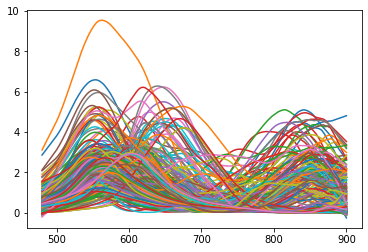

In [ ]:
#check the shape of 1D spectrum dataset
print(spec_stack.shape)

wave= np.linspace(480,900,210) 
for i in range(len(spec_stack)):
# for i in range(30):
  plt.plot(wave,spec_stack[i])

In [ ]:
labels=cluster_info
for i in np.unique(labels):
    print("class {}, # of samples {}".format(i, len(labels[labels==i])))

class 1.0, # of samples 188
class 2.0, # of samples 67
class 3.0, # of samples 38
class 4.0, # of samples 21
class 5.0, # of samples 7
class 6.0, # of samples 3
class 7.0, # of samples 3


Convert Datasets to Torch:

In [ ]:
imgdata=im_stack
specdata=spec_stack

# imgdata=im_stack[cluster_info==1]
# specdata=spec_stack[cluster_info==1]
# cluster_shape1=cluster_shape[cluster_info==1]
#normalize
specdata=specdata/specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 4, 4).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)

torch.Size([327, 96, 96]) torch.Size([327, 52])


Take a look some of examples:

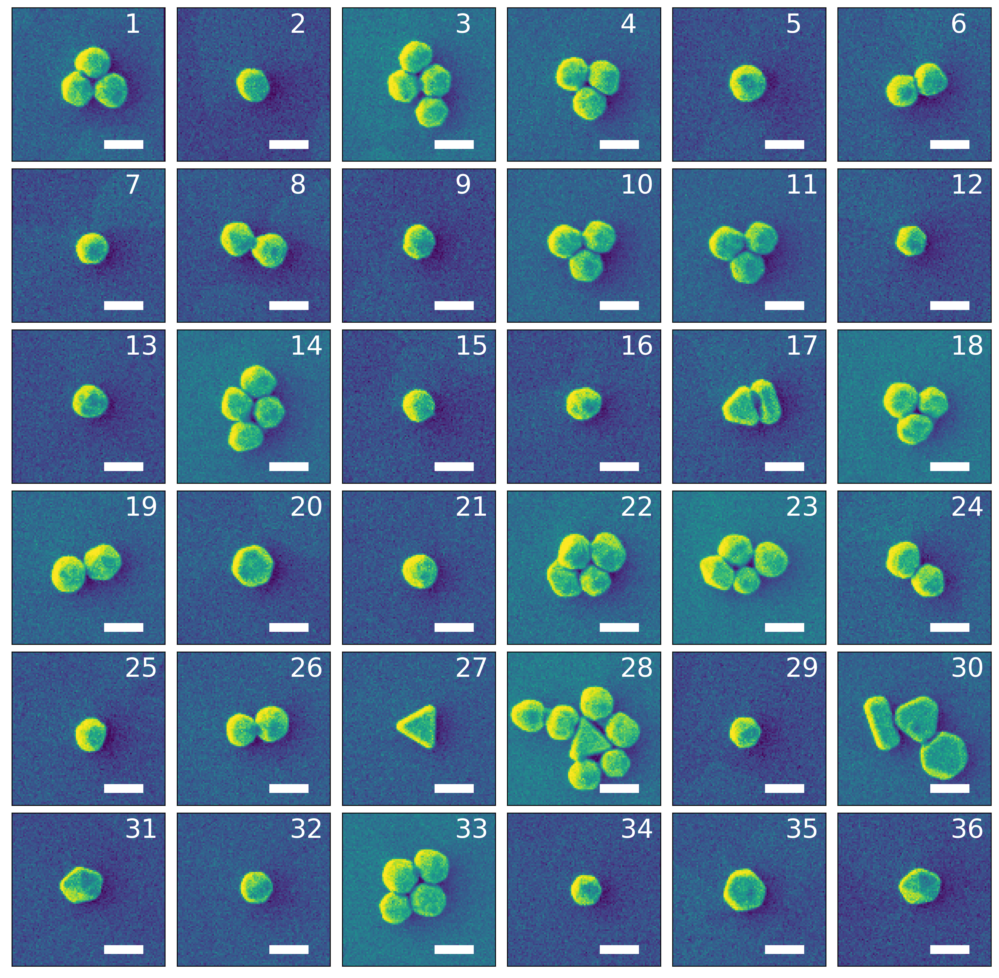

In [ ]:
# to draw a scale bar 100nm=((3024-1818)/20)/300*96=19.2
x_coor = [60, 79]
y_coor = [85, 85]


fig, axes = plt.subplots(6, 6, figsize=(16, 16), dpi=300,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.05, wspace=0.05))
i=0
for ax, im in zip(axes.flat, imgdata[70:106]):
    i+=1
    ax.imshow(im.squeeze(), cmap='viridis', interpolation='nearest')
    ax.plot(x_coor, y_coor, color="white", linewidth=8)
    ax.text(70,15,str(i),color='white',fontsize=24)

# fig.savefig('some_sem_70_106_number.png',transparent=True)

Text(0.05, 0.5, 'Extinction (a.u)')

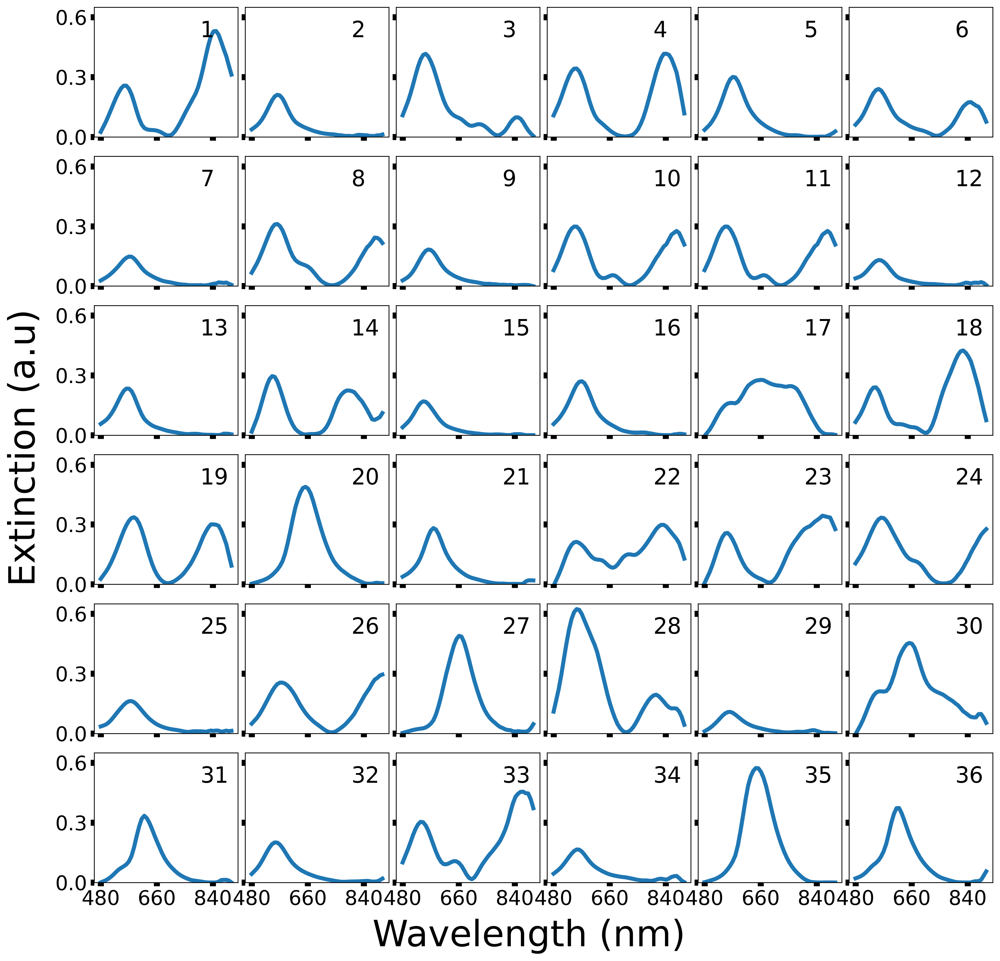

In [ ]:
wave= np.linspace(480,900,52)
fig, axes = plt.subplots(6, 6, figsize=(16, 16),sharex= True, sharey= True,dpi=300,
                         subplot_kw={'xticks':[480,660,840], 'yticks':[0,0.3,0.6], },              
                         gridspec_kw=dict(hspace=0.15, wspace=0.05,))

# for axis in ['top','bottom','left','right']:
#   ax.spines[axis].set_linewidth(0.5)
ik=0

for ax, im in zip(axes.flat, specdata[70:106]):
    ax.plot(wave,im.squeeze(),lw=4)
    ax.set_ylim(0,0.65)
    ax.tick_params(axis = 'both', which = 'major', labelsize = 20,width=6 )
    ax.text(800,0.5,str(ik+1),color='k',fontsize=22)
#     plt.setp(ax.spines.values(), linewidth=2)
#     if ik % 6 == 0:
#       ax.spines['left'].set_linewidth(4)
#     if ik > 29:
#       ax.spines['bottom'].set_linewidth(4)
    ik +=1


fig.text(0.5, 0.07, 'Wavelength (nm)', ha='center', size=36)
fig.text(0.05, 0.5, 'Extinction (a.u)', va='center', rotation='vertical',size=36)
# fig.savefig('some_spectra_70_106_number.png',transparent=True)

From here on, no more emojis...

Now let's define the ImSpec base class. It consists of a 'constructor' ```__init__``` where we define our model parameters, methods for obtaining pdf-s (e.g., ```_log_normal```), computing different loss metrics (e.g. ```_compute_kld```), performing a reparametrization trick (```_reparameterize```), etc. These methods are going to be reused in all subsequent ImSpec models. Finally, there is a ```forward``` method, which defines a forward propagation of input data through our model. Here, the images will be passed through one VAE and the spectra are going to be passed through another VAE. The first VAE also enforces rotational and (optionally) translational invariance of the latent representation. At the moment, the two paths are not interacting. Note that our ```forward``` method also records all the computed losses. 

In [ ]:
class imspec(nn.Module):

    def __init__(self,
                 indim1: Tuple[int, int], # assumed to be images
                 indim2: Tuple[int], # assumed to be spectra
                 latent_dim: int = 2,  # for now, both VAEs will have the same number of latent dims
                 coord: int = 0, # 1 for rotation, 2 for translations, 3 for rotation+translations
                 **kwargs: torch.Tensor) -> None:
        """Initialize model parameters"""
        super(imspec, self).__init__()
        device = "cuda" if torch.cuda.is_available() else 'cpu'
        # encoder and decoder for first dataset (e.g. structural images)
        self.encoder1 = fcEncoderNet(indim1, latent_dim + coord)
        dnet = sDecoderNet if coord > 0 else fcDecoderNet
        self.decoder1 = dnet(latent_dim, indim1)
        # encoder and decoder for second dataset (e.g. spectra)
        self.encoder2 = fcEncoderNet(indim2, latent_dim)
        self.decoder2 = fcDecoderNet(latent_dim, indim2)
        # Initialize grid and get 'prior' parameters for coordinate transformations
        self.grid = generate_grid(indim1).to(device)
        self.coord = coord
        self.phi_prior = kwargs.get("phi_prior", tt(math.pi / 2)).to(device)
        self.dt_prior = kwargs.get("dt_prior", tt(0.5)).to(device)
        # Place all model parameters on the appropriate device
        self.to(device)
        self.device = device

    def _compute_kld(self,
                     z: torch.Tensor,
                     q_param: Tuple[torch.Tensor],
                     p_param: Optional[Tuple[torch.Tensor]] = None
                     ) -> torch.Tensor:
        """
        Computes KL divergence term between two normal distributions
        or (if p_param = None) between normal and standard normal distributions
        """
        qz = self._log_normal(z, *q_param)
        if p_param is None:
            pz = self._log_unit_normal(z)
        else:
            pz = self._log_normal(z, *p_param)
        return qz - pz

    @classmethod
    def _reparameterize(cls,
                        z_mu: torch.Tensor,
                        z_logsig: torch.Tensor
                        ) -> torch.Tensor:
        """Reparametrization trick"""
        batch_dim = z_mu.size(0)
        z_dim = z_mu.size(1)
        z_sig = torch.exp(z_logsig)
        eps = z_mu.new(batch_dim, z_dim).normal_()
        return z_mu + z_sig * eps

    @classmethod
    def _log_normal(cls,
                   x: torch.Tensor,
                   mu: torch.Tensor,
                   log_sig: torch.Tensor
                   ) -> torch.Tensor:
        """
        Computes log-pdf of a normal distribution
        """
        log_pdf = (-0.5 * math.log(2 * math.pi) - log_sig -
                   (x - mu)**2 / (2 * torch.exp(log_sig)**2))
        return torch.sum(log_pdf, dim=-1)

    @classmethod
    def _log_unit_normal(cls, x: torch.Tensor) -> torch.Tensor:
        """
        Computes log-pdf of a unit normal distribution
        """
        log_pdf = -0.5 * (math.log(2 * math.pi) + x ** 2)
        return torch.sum(log_pdf, dim=-1)

    @classmethod
    def _compute_re(cls,
                    x: torch.Tensor,
                    x_reconstr: torch.Tensor) -> torch.Tensor:
        """Computes binary cross-entropy reconstruction loss""" 
        reconstr_loss = F.binary_cross_entropy(
            x_reconstr.flatten(1), x.flatten(1), reduction='none').sum(-1)
        return reconstr_loss

    def _transform_coordinates(self,
                               grid: torch.Tensor, 
                               t_vec: torch.Tensor) -> torch.Tensor:
        """Rotation and translation of the 2d coordinate grid"""
        phi = t_vec[:, 0]
        dt = t_vec[:, 1:].unsqueeze(1) if self.coord > 1 else 0
        grid = rotate_coordinates(grid, phi)
        return grid + self.dt_prior * dt

    def forward(self, x1: torch.Tensor, x2: torch.Tensor=None) -> torch.Tensor:
        """Forward Pass"""

        self.likelihood = 0
        self.kl_divergence = 0

        # First VAE
        # Encode data
        z_mu1, z_logsig1 = self.encoder1(x1)
        # Obtain latent vector throught he 'reparametrization trick'
        z_vec1 = self._reparameterize(z_mu1, z_logsig1)
        # Split latent vector into parts associated with coordinate transformations and data content
        t_vec1 = z_vec1[:, :self.coord]
        z_vec1 = z_vec1[:, self.coord:]
        # Compute KLD for the 'conventional' latent vector
        self.kl_divergence += self._compute_kld(
            z_vec1, (z_mu1[:, self.coord:], z_logsig1[:, self.coord:]))
        # Compute KLD for the latent angle (if any)
        if self.coord in [1, 3]:
            p_loc = t_vec1.new_zeros(t_vec1.size(0), 1)
            p_scale = t_vec1.new_ones(t_vec1.size(0), 1) * self.phi_prior
            self.kl_divergence += self._compute_kld(
                t_vec1[:, :1], (z_mu1[:, :1], z_logsig1[:, :1]), (p_loc, p_scale))
            z_mu1, z_logsig1 = z_mu1[:, 1:], z_logsig1[:, 1:]
            t_vec1 = t_vec1[:, 1:] if t_vec1.size(-1) > 1 else t_vec1
        # Compute KLD for the latent shift (if any)
        if self.coord in [2, 3]:
            self.kl_divergence += self._compute_kld(
                t_vec1, (z_mu1[:, :2], z_logsig1[:, :2])) # assume unit normal prior
        # Do the affine transformation for the coordinate grid (if any)
        decoder_input = (z_vec1,)
        if self.coord:
            grid = self.grid.expand(t_vec1.shape[0], *self.grid.shape)
            grid = self._transform_coordinates(grid, t_vec1)
            decoder_input = (grid,) + decoder_input
        # Pass latent data and transformed grid (if any) to decoder
        x_reconstr1 = self.decoder1(*decoder_input)
        # Compute reconstruction loss
        self.likelihood += -self._compute_re(x1, x_reconstr1)

        # Second VAE (just vanilla VAE)
        z_mu2, z_logsig2 = self.encoder2(x2)
        z_vec2 = self._reparameterize(z_mu2, z_logsig2)
        self.kl_divergence += self._compute_kld(z_vec2, (z_mu2, z_logsig2))
        x_reconstr2 = self.decoder2(z_vec2)
        self.likelihood += -self._compute_re(x2, x_reconstr2)

        return (z_vec1, x_reconstr1), (z_vec2, x_reconstr2)

## Train two VAEs with enforced similarity b/w latent spaces

Now, let's define an ```imspec``` class that learns a linear mapping (in a form of coefficients of a linear equation) between two latent spaces durign the training. The pass forward then consists of the following steps:
1. Pass $x_1$ through *encoder-1*. Get latent representation $z_1$. Computer KLD. Pass $z_1$ through *decoder-1*. Compute reconstruction loss.
2. Pass $x_2$ through *encoder-2*. Get latent representation $z_2$. Compute KLD (the latter is invariant under affine trasformation).
3. Get the $z_2' = Az_2$ transformation. Compute the $L_1(z_1, z_2')$ score.
4. Pass $z_2'$ through *decoder-2* and compute a reconstruction loss.

In [ ]:
class imspec3(imspec):

    def __init__(self,
                 indim1: Tuple[int, int], # assumed to be images
                 indim2: Tuple[int], # assumed to be spectra
                 latent_dim: int = 2,  # for now, both VAEs will have the same number of latent dims
                 coord: int = 0,
                 **kwargs: torch.Tensor) -> None:
        # Initilize encoders and decoders
        args = (indim1, indim2, latent_dim, coord)
        super(imspec3, self).__init__(*args, **kwargs)
        # Define the (learnable) linear transformation coefficients
        A = torch.zeros(latent_dim, latent_dim).fill_diagonal_(1)
        A = A.to(self.device)
        self.A = nn.Parameter(A)

    @classmethod
    def _compute_l1(cls,
                    x1: torch.Tensor,
                    x2: torch.Tensor) -> torch.Tensor:
        """Computes L1 score"""
        return (x1 -x2).abs().mean()

    def linear_transform(self, z: torch.Tensor):
        """Performs a linear transformation of the latent encoding"""
        return z @ self.A

    def forward(self, x1: torch.Tensor, x2: torch.Tensor) -> torch.Tensor:
        """Forward Pass"""

        self.likelihood = 0
        self.kl_divergence = 0

        # First VAE
        # Encode data
        z_mu1, z_logsig1 = self.encoder1(x1)
        # Obtain latent vector throught he 'reparametrization trick'
        z_vec1 = self._reparameterize(z_mu1, z_logsig1)
        # Split latent vector into parts associated with coordinate transformations and data content
        t_vec1 = z_vec1[:, :self.coord]
        z_vec1 = z_vec1[:, self.coord:]
        # Compute KLD for the 'conventional' latent vector
        self.kl_divergence += self._compute_kld(
            z_vec1, (z_mu1[:, self.coord:], z_logsig1[:, self.coord:]))
        # Compute KLD for the latent angle (if any)
        if self.coord in [1, 3]:
            p_loc = t_vec1.new_zeros(t_vec1.size(0), 1)
            p_scale = t_vec1.new_ones(t_vec1.size(0), 1) * self.phi_prior
            self.kl_divergence += self._compute_kld(
                t_vec1[:, :1], (z_mu1[:, :1], z_logsig1[:, :1]), (p_loc, p_scale))
            z_mu1, z_logsig1 = z_mu1[:, 1:], z_logsig1[:, 1:]
            t_vec1 = t_vec1[:, 1:] if t_vec1.size(-1) > 1 else t_vec1
        # Compute KLD for the latent shift (if any)
        if self.coord in [2, 3]:
            self.kl_divergence += self._compute_kld(
                t_vec1, (z_mu1[:, :2], z_logsig1[:, :2])) # assume unit normal prior
        # Do the affine transformation for the coordinate grid (if any)
        decoder_input = (z_vec1,)
        if self.coord:
            grid = self.grid.expand(t_vec1.shape[0], *self.grid.shape)
            grid = self._transform_coordinates(grid, t_vec1)
            decoder_input = (grid,) + decoder_input
        # Pass latent data and transformed grid (if any) to decoder
        x_reconstr1 = self.decoder1(*decoder_input)
        # Compute reconstruction loss
        self.likelihood += -self._compute_re(x1, x_reconstr1)

        # Second VAE
        z_mu2, z_logsig2 = self.encoder2(x2)
        z_mu2 = self.linear_transform(z_mu2) # Do linear transformation

        z_vec2 = self._reparameterize(z_mu2, z_logsig2)
        self.kl_divergence +=  self._compute_kld(z_vec2, (z_mu2, z_logsig2))

        self.simloss = self._compute_l1(z_vec1, z_vec2)  # Compute L1 score between two latent spaces

        x_reconstr2 = self.decoder2(z_vec2)
        self.likelihood += -self._compute_re(x2, x_reconstr2)

        return (z_vec1, x_reconstr1), (z_vec2, x_reconstr2)

Initialize, model, optimizer, and dataloader:

In [ ]:
print(imgdata.shape, specdata.shape)

torch.Size([327, 96, 96]) torch.Size([327, 52])


In [ ]:
imgdata=im_stack[:247]
specdata=spec_stack[:247]

# imgdata=im_stack[cluster_info==1]
# specdata=spec_stack[cluster_info==1]
# cluster_shape1=cluster_shape[cluster_info==1]
#normalize
specdata=specdata/specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 4, 4).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)

In [ ]:
img_dim = (96, 96)
spec_dim = (52,)

# (re-)initialize dat loader
train_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), batch_size=32)

# initialize model and optimizer
set_torch_seed(1)
model_shared= imspec3(img_dim, spec_dim, latent_dim=2, coord=3)
optimizer_shared = torch.optim.Adam(model_shared.parameters(), lr=1e-4)

Next we train our new model. Note that the main difference here is that we add a ```simloss``` term to the loss function. We also add a ```gamma``` coefficients before this new loss term which controls it's relative contribution to the total loss (similar to the idea of beta-VAE).

In [ ]:
def train_step(x1: torch.Tensor, x2: torch.Tensor,
               beta: float = 2., gamma: float = 10.) -> float:
    model_shared.train()
    _ = model_shared(x1.to(model_shared.device), x2.to(model_shared.device))
    loss = -(model_shared.likelihood - beta * model_shared.kl_divergence).mean() + gamma * model_shared.simloss
    loss.backward()
    optimizer_shared.step()
    optimizer_shared.zero_grad()
    return loss.item(), model_shared.simloss.item()

epochs = 20000

train_loss, sim = [], []
for e in range(epochs):
    train_loss_i, sim_i = 0, 0
    for (x1, x2) in train_loader:
        loss_i, sscore_i = train_step(x1, x2)
        train_loss_i += loss_i
        sim_i += sscore_i

    train_loss.append(train_loss_i / len(train_loader))
    sim.append(sim_i / len(train_loader))
    print("Epoch {},  Train loss {}".format(e+1, train_loss[-1]))

       



Streaming output truncated to the last 5000 lines.
Epoch 15001,  Train loss 6099.07998046875
Epoch 15002,  Train loss 6099.17080078125
Epoch 15003,  Train loss 6098.63974609375
Epoch 15004,  Train loss 6099.40283203125
Epoch 15005,  Train loss 6099.34072265625
Epoch 15006,  Train loss 6099.9412109375
Epoch 15007,  Train loss 6098.97392578125
Epoch 15008,  Train loss 6098.7970703125
Epoch 15009,  Train loss 6099.1685546875
Epoch 15010,  Train loss 6099.20439453125
Epoch 15011,  Train loss 6099.05146484375
Epoch 15012,  Train loss 6098.5626953125
Epoch 15013,  Train loss 6098.59453125
Epoch 15014,  Train loss 6098.63662109375
Epoch 15015,  Train loss 6098.89931640625
Epoch 15016,  Train loss 6099.51083984375
Epoch 15017,  Train loss 6099.01396484375
Epoch 15018,  Train loss 6099.16240234375
Epoch 15019,  Train loss 6099.43271484375
Epoch 15020,  Train loss 6099.05791015625
Epoch 15021,  Train loss 6098.75224609375
Epoch 15022,  Train loss 6098.57607421875
Epoch 15023,  Train loss 6098.93

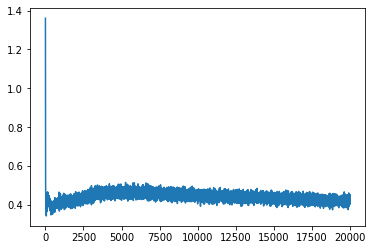

In [ ]:
plt.plot(sim)

Mounted at /content/drive


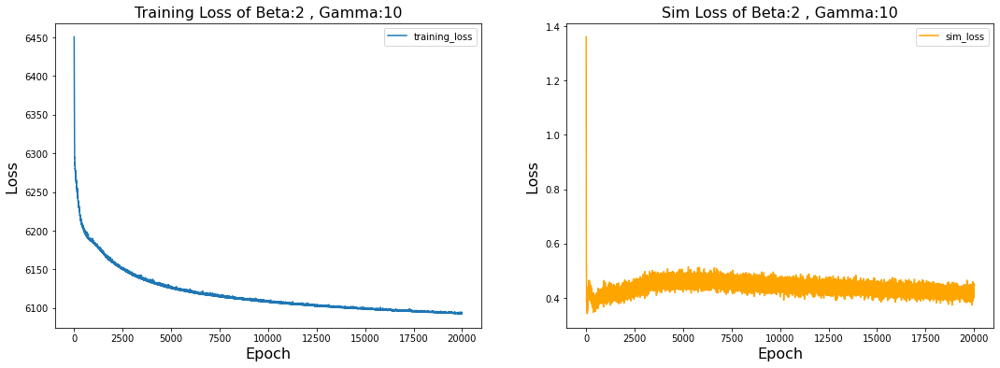

In [ ]:
fig, axes = plt.subplots(1,2, figsize =(18, 6))
a0 = axes[0].plot(train_loss, label="training_loss",)

axes[0].set_xlabel("Epoch", fontsize=16)
axes[0].set_ylabel("Loss ", fontsize=16)
axes[0].set_title('Training Loss of Beta:2 , Gamma:10', fontsize = 16)
axes[0].legend()

a1 = axes[1].plot(sim,c='orange', label="sim_loss",)

axes[1].set_xlabel("Epoch", fontsize=16)
axes[1].set_ylabel("Loss ", fontsize=16)
axes[1].set_title('Sim Loss of Beta:2 , Gamma:10', fontsize = 16)
axes[1].legend()

Encode data into the latent spaces. Note that we have an extra line that applies a learned transformation to the encoded $z$.

In [ ]:
#pre-trained model
model_file_directory='/content/dual_VAE_dataset/model_shared.pt'

imgdata=im_stack
specdata=spec_stack

# imgdata=im_stack[cluster_info==1]
# specdata=spec_stack[cluster_info==1]
# cluster_shape1=cluster_shape[cluster_info==1]
#normalize
specdata=specdata/specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 4, 4).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)


img_dim = (96, 96)
spec_dim = (52,)
# Model class must be defined somewhere

model_shared=imspec3(img_dim, spec_dim, latent_dim=2, coord=3)

optimizer_shared= torch.optim.Adam(model_shared.parameters(), lr=1e-4)
model_shared.load_state_dict(torch.load(model_file_directory,map_location=torch.device('cuda'))) ##change cpu to gpu wgen you use it
# model.eval()
model_shared.eval()

torch.Size([327, 96, 96]) torch.Size([327, 52])


imspec3(
  (encoder1): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=9216, out_features=256, bias=True)
      (1): Tanh()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): Tanh()
    )
    (fc11): Linear(in_features=256, out_features=5, bias=True)
    (fc12): Linear(in_features=256, out_features=5, bias=True)
  )
  (decoder1): sDecoderNet(
    (coord_latent): coord_latent(
      (fc_coord): Linear(in_features=2, out_features=256, bias=True)
      (fc_latent): Linear(in_features=2, out_features=256, bias=False)
      (activation): Tanh()
    )
    (fc_layers): Sequential(
      (0): Linear(in_features=256, out_features=256, bias=True)
      (1): Tanh()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): Tanh()
    )
    (out): Linear(in_features=256, out_features=1, bias=True)
    (activation_out): Sigmoid()
  )
  (encoder2): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=52, out_feature

Take a look to latent space

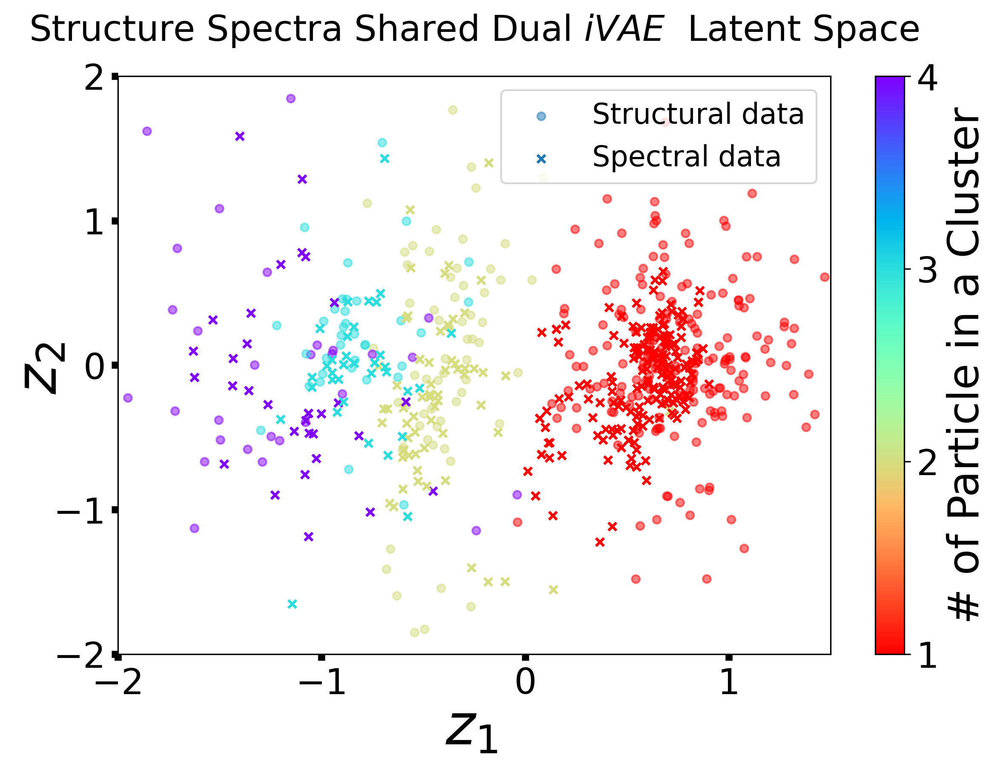

In [ ]:
# initialize test dataloader (here it using the same data as the training dataloader but without random shuffling)
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

model_shared.eval()  # switch to evaluation model (turn off batchnorm, etc.)
with torch.no_grad():  # we do not need to track gradients at the prediction stage
    z_mu1_im_sh1 = torch.cat([model_shared.encoder1(x.to(model_shared.device))[0].cpu() for (x,_) in test_loader])  # encoded image data
    z_mu2_spec_sh1 = torch.cat([model_shared.encoder2(x.to(model_shared.device))[0].cpu() for (_,x) in test_loader])  # encoded spectral data
    z_mu2_spec_sh1 = z_mu2_spec_sh1.matmul(model_shared.A.cpu())  # a.matmul(b) is equivalent to a @ b and to torch.matmul(a, b) 

labels=cluster_info

fig, axes = plt.subplots(1,1, figsize =(9, 6),dpi=300)
a0 = axes.scatter(z_mu1_im_sh1[:, -1], z_mu1_im_sh1[:, -2], s=20, marker='o',alpha=0.5, label="Structural data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
a0=axes.scatter(z_mu2_spec_sh1[:, -1], z_mu2_spec_sh1[:, -2], s=20, marker='x',alpha=1, label="Spectral data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
axes.set_xlabel("$z_1$ ", fontsize=32, labelpad=0)
axes.set_xlim([-2,1.5],)
axes.set_xticks(ticks=[-2,-1,0,1,])
axes.set_ylim([-2,2],)
axes.set_yticks(ticks=[-2,-1,0,1,2])
axes.set_ylabel("$z_2$ ", fontsize=32, labelpad=0)
axes.yaxis.set_label_coords(-0.07, 0.5)
axes.set_title('Structure Spectra Shared Dual $iVAE$  Latent Space', fontsize = 20, pad=20)
axes.legend(fontsize=16, loc='upper right')
axes.tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

# cbar_ax1 = fig.add_axes([0.48, 0.25, 0.01, 0.5])
cbar1 = fig.colorbar(a0, ax=axes, ticks = [1, 2, 3, 4])
cbar1.set_label('# of Particle in a Cluster',fontsize=24, )
cbar1.ax.tick_params(labelsize=20)


# ptlt.savefig('Combined_structure_spectra_latentspace_shared.png',transparent =True)

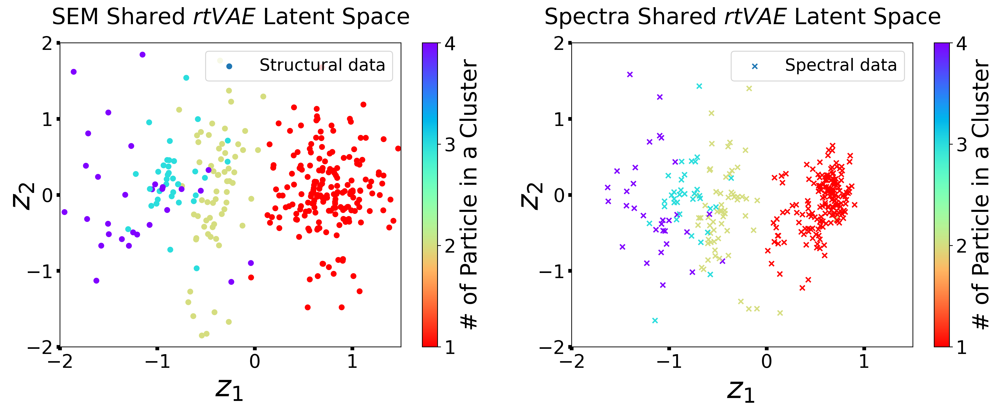

In [ ]:
# initialize test dataloader (here it using the same data as the training dataloader but without random shuffling)
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

model_shared.eval()  # switch to evaluation model (turn off batchnorm, etc.)
with torch.no_grad():  # we do not need to track gradients at the prediction stage
    z_mu1_im_sh1 = torch.cat([model_shared.encoder1(x.to(model_shared.device))[0].cpu() for (x,_) in test_loader])  # encoded image data
    z_mu2_spec_sh1 = torch.cat([model_shared.encoder2(x.to(model_shared.device))[0].cpu() for (_,x) in test_loader])  # encoded spectral data
    z_mu2_spec_sh1 = z_mu2_spec_sh1.matmul(model_shared.A.cpu())  # a.matmul(b) is equivalent to a @ b and to torch.matmul(a, b) 

labels=cluster_info


fig, axes = plt.subplots(1,2, figsize =(18, 6),dpi=300)
a0 = axes[0].scatter(z_mu1_im_sh1[:, -1], z_mu1_im_sh1[:, -2], s=28, marker='o', label="Structural data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
# axes[0].scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=24, marker='x', alpha=1, label="Spectra data", c=labels,  cmap='RdYlBu', vmin=1, vmax=7)
axes[0].set_xlabel("$z_1$ ", fontsize=32, labelpad=2)
axes[0].set_xlim([-2,1.5],)
axes[0].set_xticks(ticks=[-2,-1,0,1,])
axes[0].set_ylim([-2,2],)
axes[0].set_yticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylabel("$z_2$ ", fontsize=32, labelpad=3)
axes[0].yaxis.set_label_coords(-0.07, 0.5)
axes[0].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

axes[0].set_title('SEM Shared $rtVAE$ Latent Space', fontsize = 24,pad =20)
axes[0].legend(fontsize=18, loc='upper right')

# cbar_ax1 = fig.add_axes([0.48, 0.25, 0.01, 0.5])
cbar1 = fig.colorbar(a0, ax=axes[0], ticks = [1, 2, 3, 4, ])
cbar1.set_label('# of Particle in a Cluster',fontsize=24)
cbar1.ax.tick_params(labelsize=20)

# a1 = axes[1].scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -2], s=24, marker='o', label="SEM data", c=labels,  cmap='RdYlGn', vmin=1, vmax=7)
a1=axes[1].scatter(z_mu2_spec_sh1[:, -1], z_mu2_spec_sh1[:, -2], s=28, marker='x', label="Spectral data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
axes[1].set_xlabel("$z_1$ ", fontsize=32)
axes[1].set_ylabel("$z_2$ ", fontsize=32)
axes[1].set_xlim([-2,1.5],)
axes[1].set_xticks(ticks=[-2,-1,0,1,])
axes[1].set_ylim([-2,2],)
axes[1].set_yticks(ticks=[-2,-1,0,1,2])
axes[1].yaxis.set_label_coords(-0.08, 0.5)
axes[1].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )
axes[1].set_title('Spectra Shared $rtVAE$ Latent Space', fontsize = 24, pad =20)
axes[1].legend(fontsize=18,loc='upper right')
# cbar_ax2 = fig.add_axes([0.902, 0.25, 0.01, 0.5])
cbar2 = fig.colorbar(a1, ax=axes[1], ticks = [1, 2, 3, 4, ], )
cbar2.set_label('# of Particle in a Cluster',fontsize=24)
cbar2.ax.tick_params(labelsize=20)
# a1.set_clim(5,7)
# cbar2.set_label('Shape of Cluster',fontsize=16,)
# cbar2.set_ticklabels(labels3)

# plt.savefig('Separated_structure_spectra_latentspace_clustersize_shared.png',transparent =True)

View the learned latent manifolds. Note that we have an extra line that applies a learned transformation to the $z$ vector.

In [ ]:
d = 6
z, (gridx, gridy) = generate_latent_grid(d)
z_t = torch.matmul(z, model_shared.A.cpu())
coord_grid = model_shared.grid.expand(len(z), *model_shared.grid.shape)

with torch.no_grad():
    manifold1_sh_im1 = model_shared.decoder1(coord_grid, z.to(model_shared.device)).cpu()
    manifold2_sh_spec1= model_shared.decoder2(z_t.to(model_shared.device)).cpu()

([], <a list of 0 Text major ticklabel objects>)

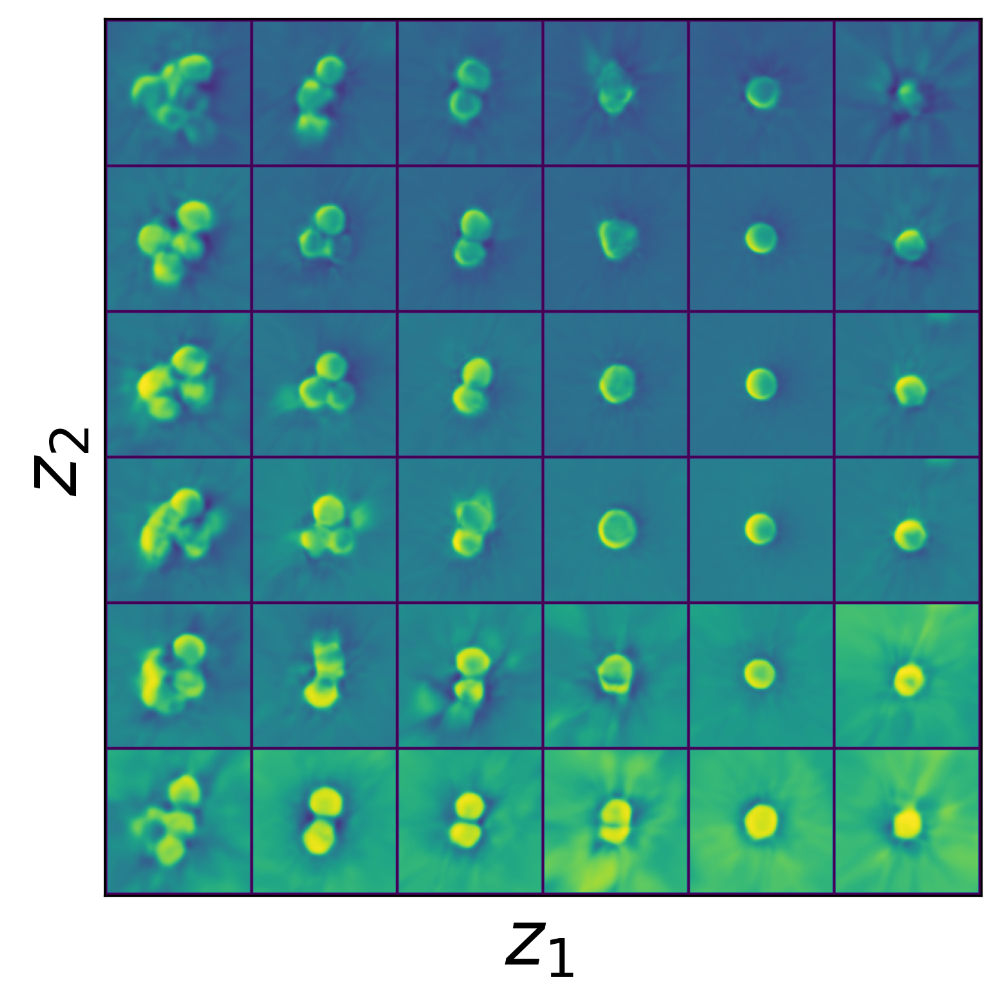

In [ ]:
grid = torchvision.utils.make_grid(manifold1_sh_im1, nrow=d, padding=2, pad_value=0)[0]
plt.figure(figsize=(6,6), dpi=300)
plt.imshow(grid, cmap='viridis')
plt.xlabel("$z_1$ ", fontsize=28)
plt.ylabel("$z_2$ ", fontsize=28)
plt.xticks([])
plt.yticks([])

# plt.savefig('Latent_space_image.jpg')

Text(0.02, 0.5, 'Intensity (a.u.)')

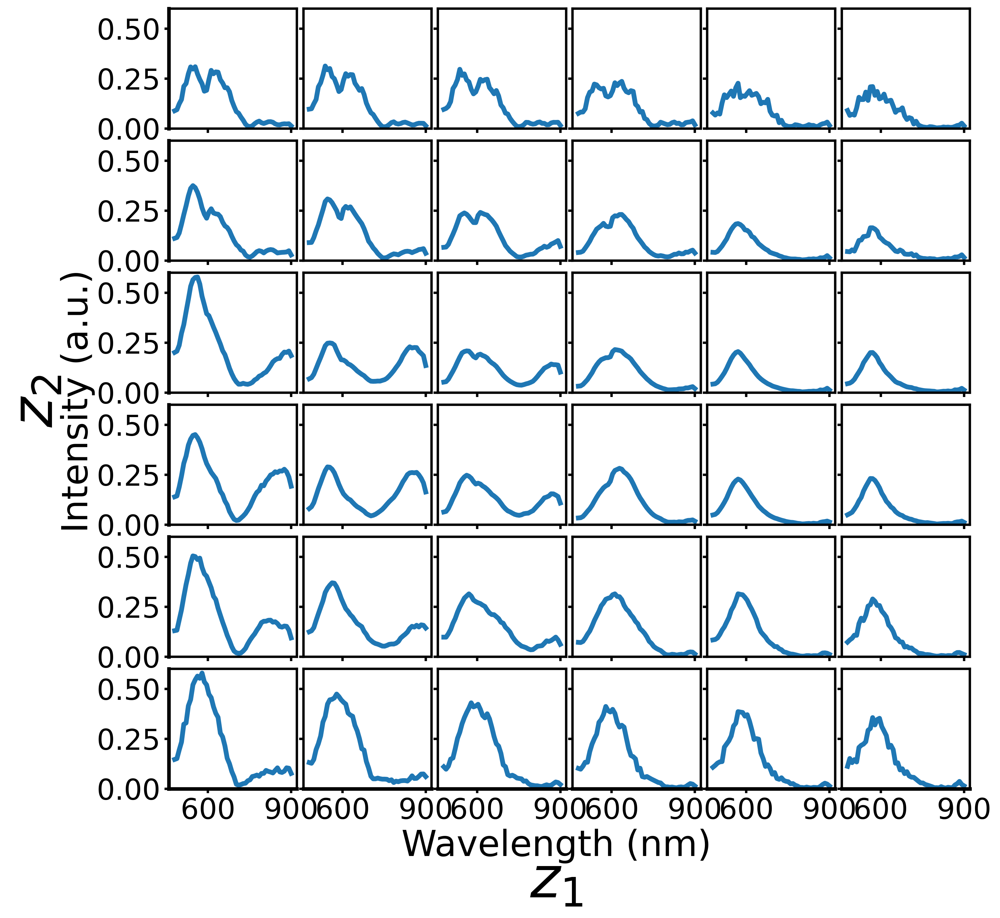

In [ ]:
wave=np.linspace(480,900,52)
fig, axes = plt.subplots(d, d, figsize=(12, 12), sharex= True, sharey= True,dpi=300,
                       subplot_kw={'xticks': [600,900],'yticks':[0,0.25,0.5] },
                       gridspec_kw=dict(hspace=0.1, wspace=0.05))
ik=0
for ax, y in zip(axes.flat, manifold2_sh_spec1):
    ax.plot(wave, y.squeeze(), lw=4)
    ax.set_ylim(0, .6)
    ax.tick_params(axis = 'both', which = 'major', labelsize =24,width=2 )
    plt.setp(ax.spines.values(), linewidth=2)
    # ax.vlines(x=20,ymin=0, ymax=0.6, linewidth=1, color='k',linestyles='--')
    if ik % 6 == 0:
      ax.spines['left'].set_linewidth(3)
    if ik > 29:
      ax.spines['bottom'].set_linewidth(3)
    ik +=1

fig.text(0.5, 0.02, '$z_1$', ha='center', size=48)
fig.text(-0.03, 0.5, '$z_2$', va='center', rotation='vertical',size=48)
fig.text(0.5, 0.06, 'Wavelength (nm)', ha='center', size=30)
fig.text(0.02, 0.5, 'Intensity (a.u.)', va='center', rotation='vertical',size=30)
# fig.savefig('Latent_space_spectra.jpg')

Let's also define a function that takes images (spectra) as an input at outputs spectra (images) and try it on the image -> spectrum predictions.

In [ ]:
def hybrid_fwd(model: Type[torch.nn.Module], x: torch.Tensor,
               out: str) -> torch.Tensor:
    """
    Passes the input features through the encoder of the first (second) model to obtain
    a latent code which is then passed through the decoder of the second (first) model
    """
    if out not in ['image', 'spectrum']:
        raise NotImplementedError("argument 'out' must be 'image' or 'spectrum'")
    x = x.to(model.device)
    model.eval()
    with torch.no_grad():
        z_mu = model.encoder2(x)[0] @ model.A if out == 'image' else model.encoder1(x)[0]
        z_mu = z_mu[:, model.coord:] if out == 'spectrum' else z_mu
        dec1_input = (z_mu,)
        if model.coord > 0:
            grid = model.grid.expand(z_mu.size(0), *model.grid.size())
            dec1_input = (grid,) + dec1_input
        x_rec = model.decoder1(*dec1_input) if out == 'image' else model.decoder2(z_mu)
    return x_rec.cpu()



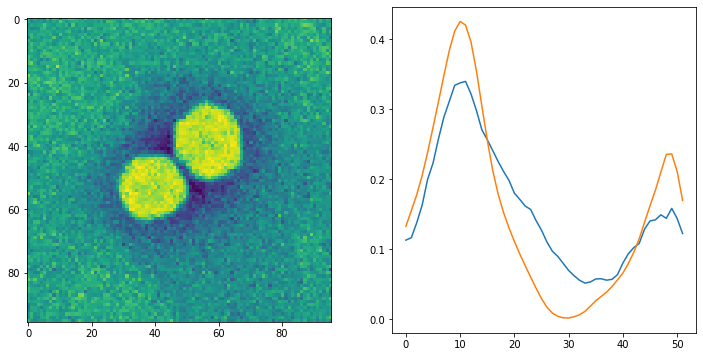

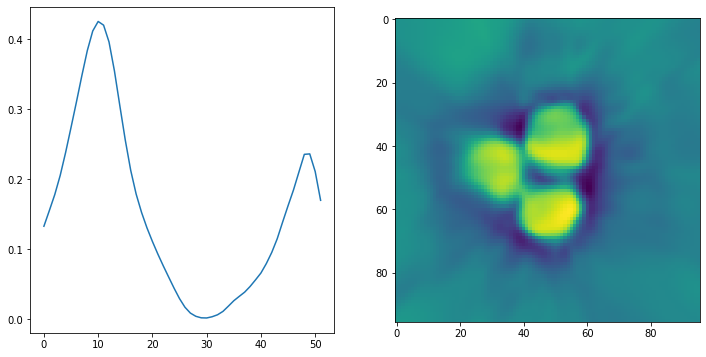

In [ ]:
k = 6
x_input = imgdata[k]
x_input = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred = hybrid_fwd(model_shared, x_input, out='spectrum')

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(x_input.squeeze())
ax2.plot(x_pred.squeeze())
ax2.plot(specdata[k])
plt.show()

## We can also try predicting image from spectra.
x_input = specdata[k]
x_input = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred = hybrid_fwd(model_shared, x_input, out='image')

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax2.imshow(x_pred.squeeze())
ax1.plot(x_input.squeeze())

Predict full dataset:

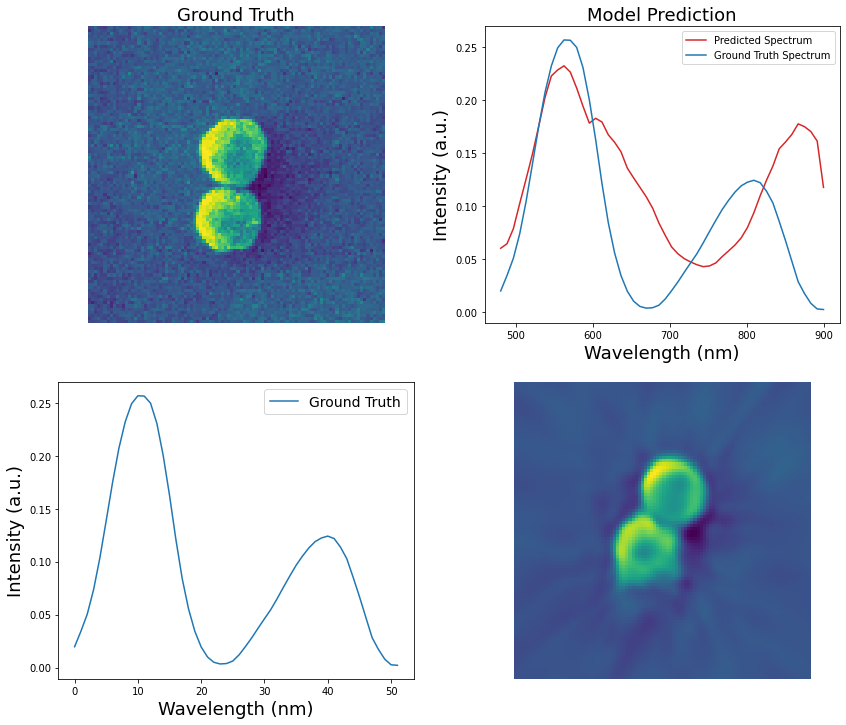

In [ ]:
k = 257 # input image/spectra index


wave=np.linspace(480,900,52)



fig, axes = plt.subplots(2,2 , figsize=(14,12), )

#Image as a input 
x_input = imgdata[k]
x_input_im = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_spec = hybrid_fwd(model_shared, x_input_im, out='spectrum')

axes[0,0].imshow(x_input_im.squeeze())
axes[0,0].set_title('Ground Truth', size=18)
axes[0,0].axis('off')

axes[0,1].plot(wave,x_pred_spec.squeeze(), c='tab:red',label='Predicted Spectrum', )
axes[0,1].plot(wave,specdata[k],'tab:blue', label='Ground Truth Spectrum')
# a0.set_clim(0,0.00003)
axes[0,1].legend()
axes[0,1].set_xlabel('Wavelength (nm)', fontsize=18)
axes[0,1].set_ylabel('Intensity (a.u.)', fontsize=18)
axes[0,1].set_title('Model Prediction', size=18)

#spectra as a input 
x_input = specdata[k]
x_input_spec = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_im= hybrid_fwd(model_shared, x_input_spec, out='image')

# axes[1,0].plot(x_pred.squeeze(), c='tab:red',label='Predict', )
axes[1,0].plot(specdata[k],c='tab:blue', label='Ground Truth')
# a0.set_clim(0,0.00003)

axes[0,1].legend()

axes[1,0].set_xlabel('Wavelength (nm)', fontsize=18)
axes[1,0].set_ylabel('Intensity (a.u.)', fontsize=18)
# axes[1,0].set_title('Ground Truth', size=18)
axes[1,0].legend(fontsize=14)

axes[1,1].imshow(x_pred_im.squeeze())
# axes[1,1].set_title("Model Prediction", size=18)
axes[1,1].axis('off')





plt.show()




## Train two VAEs without enforcing similarity b/w latent spaces
Now let's proceed to model training. First, we simply train two VAEs (one for images, and another for spectra) without enforcing similarity between the latent spaces.

In [ ]:
print(imgdata.shape, specdata.shape)

torch.Size([327, 96, 96]) torch.Size([327, 52])


In [ ]:
imgdata=im_stack[:247]
specdata=spec_stack[:247]

# imgdata=im_stack[cluster_info==1]
# specdata=spec_stack[cluster_info==1]
# cluster_shape1=cluster_shape[cluster_info==1]
#normalize
specdata=specdata/specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 4, 4).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)

torch.Size([247, 96, 96]) torch.Size([247, 52])


Initialize dataloader:

In [ ]:
# norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
# imgdata = norm_(imgdata)
# specdata = norm_(specdata)

train_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), batch_size=32)  # unsqueeze(1) adds a channel dimension of 1

Initialize our model and an optimizer:

In [ ]:
img_dim = (96, 96)
spec_dim = (52,)

set_torch_seed(1)
model_unshared = imspec(img_dim, spec_dim, latent_dim=2, coord=1)
optimizer_unshared = torch.optim.Adam(model_unshared.parameters(), lr=1e-4)

Finaly, we train the model. It is usually convenient to define a function that performs a single training step and then call it from within the training loop.

In [ ]:
def train_step(x1: torch.Tensor, x2: torch.Tensor,
               beta: float = 2.) -> float:
    """ Single train step"""
    model_unshared.train()
    _ = model_unshared(x1.to(model_unshared.device), x2.to(model_unshared.device))
    loss = -(model_unshared.likelihood - beta * model_unshared.kl_divergence).mean()  # compute losses
    loss.backward()
    optimizer_unshared.step()
    optimizer_unshared.zero_grad()
    return loss.item()

epochs = 20000
# training loop
train_loss = []
for e in range(epochs):
    train_loss_i = 0
    for (x1, x2) in train_loader:
        train_loss_i += train_step(x1, x2)
    train_loss.append(train_loss_i / len(train_loader))
    print("Epoch {},  Train loss {}".format(e+1, train_loss[-1]))

Epoch 1,  Train loss 6395.606018066406
Epoch 2,  Train loss 6349.447692871094
Epoch 3,  Train loss 6340.208251953125
Epoch 4,  Train loss 6339.053466796875
Epoch 5,  Train loss 6335.157653808594
Epoch 6,  Train loss 6329.84375
Epoch 7,  Train loss 6327.2540283203125
Epoch 8,  Train loss 6327.626281738281
Epoch 9,  Train loss 6326.862365722656
Epoch 10,  Train loss 6330.894714355469
Epoch 11,  Train loss 6324.682373046875
Epoch 12,  Train loss 6317.030090332031
Epoch 13,  Train loss 6312.45947265625
Epoch 14,  Train loss 6309.200256347656
Epoch 15,  Train loss 6309.904541015625
Epoch 16,  Train loss 6292.035888671875
Epoch 17,  Train loss 6303.255187988281
Epoch 18,  Train loss 6296.929443359375
Epoch 19,  Train loss 6278.780822753906
Epoch 20,  Train loss 6264.2269287109375
Epoch 21,  Train loss 6254.732604980469
Epoch 22,  Train loss 6242.9124755859375
Epoch 23,  Train loss 6240.4600830078125
Epoch 24,  Train loss 6240.720764160156
Epoch 25,  Train loss 6241.9837646484375
Epoch 26,  T

Encode data into the latent space(s) using the trained model:

In [ ]:
print(imgdata.shape, specdata.shape)

torch.Size([327, 96, 96]) torch.Size([327, 52])


In [ ]:
imgdata=im_stack
specdata=spec_stack
# imgdata=im_stack[cluster_info==1]
# specdata=spec_stack[cluster_info==1]
# cluster_shape1=cluster_shape[cluster_info==1]
#normalize
specdata=specdata/specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 4, 4).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)

torch.Size([327, 96, 96]) torch.Size([327, 52])


In [ ]:
model_file_directory='/content/dual_VAE_dataset/model__unshared.pt'

img_dim = (96, 96)
spec_dim = (52,)
# Model class must be defined somewhere

model_unshared=imspec(img_dim, spec_dim, latent_dim=2, coord=3)

optimizer_unshared= torch.optim.Adam(model_unshared.parameters(), lr=1e-4)
model_unshared.load_state_dict(torch.load(model_file_directory,map_location=torch.device('cpu'))) ##change cpu to gpu wgen you use it
# model.eval()
model_unshared.eval()

imspec(
  (encoder1): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=9216, out_features=256, bias=True)
      (1): Tanh()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): Tanh()
    )
    (fc11): Linear(in_features=256, out_features=5, bias=True)
    (fc12): Linear(in_features=256, out_features=5, bias=True)
  )
  (decoder1): sDecoderNet(
    (coord_latent): coord_latent(
      (fc_coord): Linear(in_features=2, out_features=256, bias=True)
      (fc_latent): Linear(in_features=2, out_features=256, bias=False)
      (activation): Tanh()
    )
    (fc_layers): Sequential(
      (0): Linear(in_features=256, out_features=256, bias=True)
      (1): Tanh()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): Tanh()
    )
    (out): Linear(in_features=256, out_features=1, bias=True)
    (activation_out): Sigmoid()
  )
  (encoder2): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=52, out_features

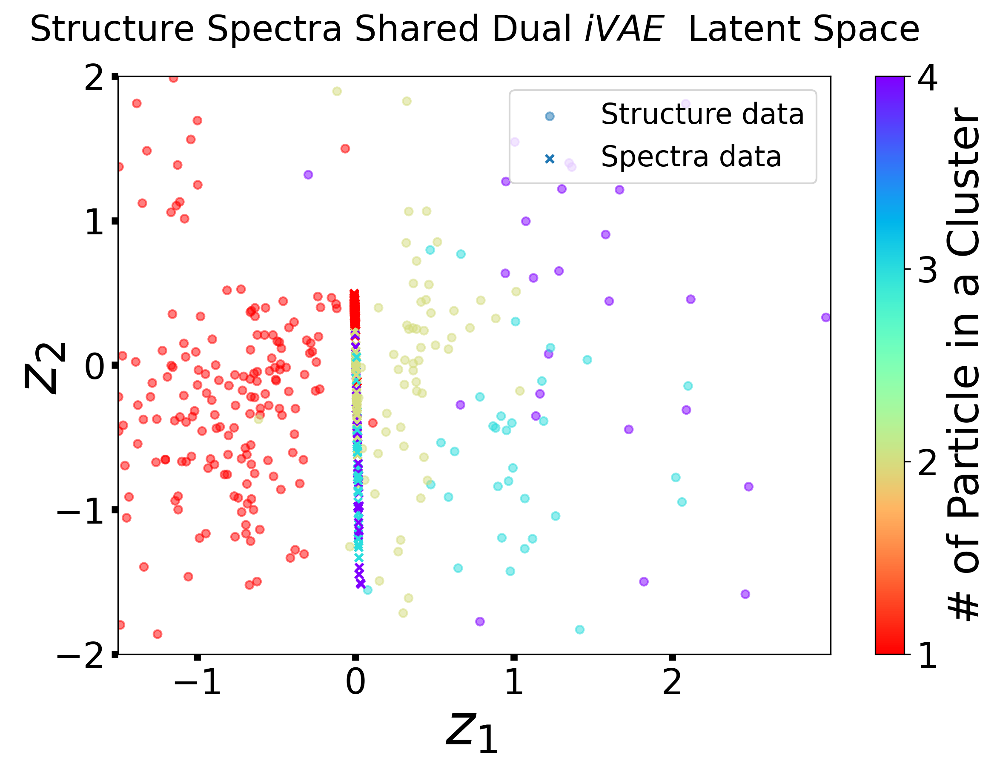

In [ ]:


# initialize test dataloader (here it using the same data as the training dataloader but without random shuffling)
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

model_unshared.eval()  # switch to evaluation model (turn off batchnorm, etc.)
with torch.no_grad():  # we do not need to track gradients at the prediction stage
    z_mu1_im_un1 = torch.cat([model_unshared.encoder1(x.to(model_unshared.device))[0].cpu() for (x,_) in test_loader])  # encoded image data
    z_mu2_spec_un1 = torch.cat([model_unshared.encoder2(x.to(model_unshared.device))[0].cpu() for (_,x) in test_loader])  # encoded spectral data

labels=cluster_info


fig, axes = plt.subplots(1,1, figsize =(9, 6),dpi=300)
a0 = axes.scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -2], s=20, marker='o',alpha=0.5, label="Structure data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
a0=axes.scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=20, marker='x', alpha=1, label="Spectra data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
axes.set_xlabel("$z_1$ ", fontsize=32, labelpad=0)
axes.set_xlim([-1.5,3],)
axes.set_xticks(ticks=[-1,0,1,2])
axes.set_ylim([-2,2],)
axes.set_yticks(ticks=[-2,-1,0,1,2])
axes.set_ylabel("$z_2$ ", fontsize=32, labelpad=0)
axes.yaxis.set_label_coords(-0.07, 0.5)
axes.set_title('Structure Spectra Shared Dual $iVAE$  Latent Space', fontsize = 20, pad=20)
axes.legend(fontsize=16, loc='upper right')
axes.tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

# cbar_ax1 = fig.add_axes([0.48, 0.25, 0.01, 0.5])
cbar1 = fig.colorbar(a0, ax=axes, ticks = [1, 2, 3, 4])
cbar1.set_label('# of Particle in a Cluster',fontsize=24, )
cbar1.ax.tick_params(labelsize=20)


# plt.savefig('Combined_structure_spectra_latentspace.jpg')

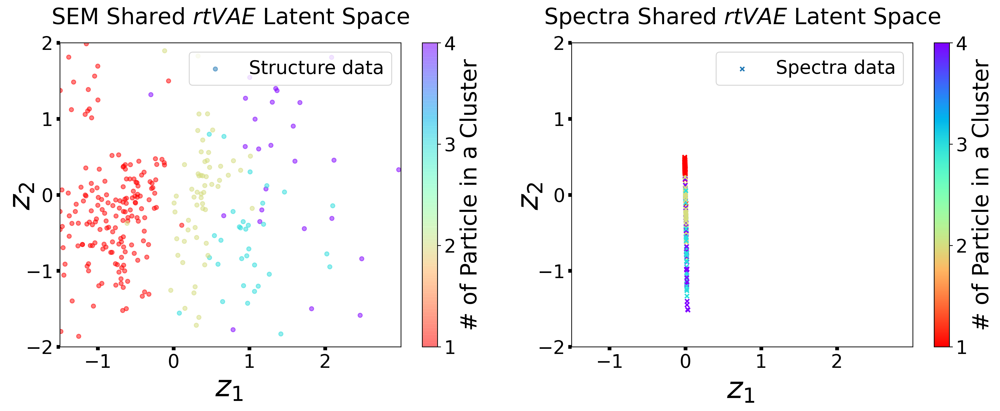

In [ ]:
# initialize test dataloader (here it using the same data as the training dataloader but without random shuffling)
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

model_unshared.eval()  # switch to evaluation model (turn off batchnorm, etc.)
with torch.no_grad():  # we do not need to track gradients at the prediction stage
    z_mu1_im_un1 = torch.cat([model_unshared.encoder1(x.to(model_unshared.device))[0].cpu() for (x,_) in test_loader])  # encoded image data
    z_mu2_spec_un1 = torch.cat([model_unshared.encoder2(x.to(model_unshared.device))[0].cpu() for (_,x) in test_loader])  # encoded spectral data

labels=cluster_info


fig, axes = plt.subplots(1,2, figsize =(18, 6),dpi=300)
a0 = axes[0].scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -2], s=20, marker='o',alpha=0.5, label="Structure data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
# axes[0].scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=24, marker='x', alpha=1, label="Spectra data", c=labels,  cmap='RdYlBu', vmin=1, vmax=7)
axes[0].set_xlabel("$z_1$ ", fontsize=32, labelpad=2)
axes[0].set_xlim([-1.5,3],)
axes[0].set_xticks(ticks=[-1,0,1,2])
axes[0].set_ylim([-2,2],)
axes[0].set_yticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylabel("$z_2$ ", fontsize=32, labelpad=3)
axes[0].yaxis.set_label_coords(-0.07, 0.5)
axes[0].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

axes[0].set_title('SEM Shared $rtVAE$ Latent Space', fontsize = 24,pad =20)
axes[0].legend(fontsize=20, loc='upper right')

# cbar_ax1 = fig.add_axes([0.48, 0.25, 0.01, 0.5])
cbar1 = fig.colorbar(a0, ax=axes[0], ticks = [1, 2, 3, 4, ])
cbar1.set_label('# of Particle in a Cluster',fontsize=24)
cbar1.ax.tick_params(labelsize=20)

# a1 = axes[1].scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -2], s=24, marker='o', label="SEM data", c=labels,  cmap='RdYlGn', vmin=1, vmax=7)
a1=axes[1].scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=20, marker='x', alpha=1, label="Spectra data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
axes[1].set_xlabel("$z_1$ ", fontsize=32)
axes[1].set_ylabel("$z_2$ ", fontsize=32)
axes[1].set_xlim([-1.5,3],)
axes[1].set_xticks(ticks=[-1,0,1,2])
axes[1].set_ylim([-2,2],)
axes[1].set_yticks(ticks=[-2,-1,0,1,2])
axes[1].yaxis.set_label_coords(-0.08, 0.5)
axes[1].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )
axes[1].set_title('Spectra Shared $rtVAE$ Latent Space', fontsize = 24, pad =20)
axes[1].legend(fontsize=20,loc='upper right')
# cbar_ax2 = fig.add_axes([0.902, 0.25, 0.01, 0.5])
cbar2 = fig.colorbar(a1, ax=axes[1], ticks = [1, 2, 3, 4, ], )
cbar2.set_label('# of Particle in a Cluster',fontsize=24)
cbar2.ax.tick_params(labelsize=20)
# a1.set_clim(5,7)
# cbar2.set_label('Shape of Cluster',fontsize=16,)
# cbar2.set_ticklabels(labels3)

# plt.savefig('Separated_structure_spectra_latentspace_clustersize.jpg')

In [ ]:
# initialize test dataloader (here it using the same data as the training dataloader but without random shuffling)
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

model_unshared.eval()  # switch to evaluation model (turn off batchnorm, etc.)
with torch.no_grad():  # we do not need to track gradients at the prediction stage
    z_mu1_im_un1 = torch.cat([model_unshared.encoder1(x.to(model_unshared.device))[0].cpu() for (x,_) in test_loader])  # encoded image data
    z_mu2_spec_un1 = torch.cat([model_unshared.encoder2(x.to(model_unshared.device))[0].cpu() for (_,x) in test_loader])  # encoded spectral data

labels=cluster_info


fig, axes = plt.subplots(1,2, figsize =(18, 6),dpi=300)
a0 = axes[1].scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -2], s=20, marker='o',alpha=1, label="Structural data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
# a0=axes.scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=20, marker='^', alpha=1, label="Spectra data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
axes[1].set_xlabel("$z_1$ ", fontsize=32, labelpad=0)
axes[1].set_xlim([-2,2.5],)
axes[1].set_xticks(ticks=[-2,-1,0,1,2])
axes[1].set_ylim([-2.5,2.5],)
axes[1].set_yticks(ticks=[-2,-1,0,1,2])
axes[1].set_ylabel("$z_2$ ", fontsize=32, labelpad=0)
axes[1].yaxis.set_label_coords(-0.07, 0.5)
axes[1].set_title('Structure $rtVAE$  Latent Space', fontsize = 20, pad=20)
axes[1].legend(fontsize=16, loc='upper right')
axes[1].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

# cbar_ax1 = fig.add_axes([0.48, 0.25, 0.01, 0.5])
cbar1 = fig.colorbar(a0, ax=axes[1], ticks = [1, 2, 3, 4, ])
cbar1.set_label('# of Particles in a Cluster',fontsize=24)
cbar1.ax.tick_params(labelsize=20)

# a1 = axes[1].scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -2], s=24, marker='o', label="SEM data", c=labels,  cmap='RdYlGn', vmin=1, vmax=7)
# a1=axes[1].scatter(z_mu2_spec_sh1[:, -1], z_mu2_spec_sh1[:, -2], s=28, marker='x', label="Spectra data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)
a1=axes[0].scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=20, marker='x', alpha=1, label="Spectral data", c=labels,  cmap='rainbow_r', vmin=1, vmax=4)

axes[0].set_xlabel("$z_1$ ", fontsize=32)
axes[0].set_ylabel("$z_2$ ", fontsize=32)
axes[0].set_xlim([-0.05,0.05],)
axes[0].set_xticks(ticks=[-0.04,-0.02,0,0.02,0.04])
axes[0].set_ylim([-1.5,1.1],)
axes[0].set_yticks(ticks=[-1.5,-1.0,-0.5, 0,0.5,1])
axes[0].yaxis.set_label_coords(-0.18, 0.5)
axes[0].tick_params(axis = 'both', which = 'major', labelsize = 18,width=4 )
axes[0].set_title('Spectra $rtVAE$ Latent Space', fontsize = 20, pad =20)
axes[0].legend(fontsize=16,loc='upper left')
# cbar_ax2 = fig.add_axes([0.902, 0.25, 0.01, 0.5])
cbar2 = fig.colorbar(a1, ax=axes[0], ticks = [1, 2, 3, 4, ], )
cbar2.set_label('# of Particles in a Cluster',fontsize=24)
cbar2.ax.tick_params(labelsize=20)
# a1.set_clim(5,7)
# cbar2.set_label('Shape of Cluster',fontsize=16,)
# cbar2.set_ticklabels(labels3)

# plt.savefig('Separated_structure_spectra_latentspace_clustersize_un.png',transparent=True)

Now let's view the learned latent manifold(s) by projecting them to the data space(s):

In [ ]:
d = 6  # grid size
z, (gridx, gridy) = generate_latent_grid(d)
coord_grid = model_unshared.grid.expand(len(z), *model_unshared.grid.shape)

with torch.no_grad():
    manifold1_un_im1 = model_unshared.decoder1(coord_grid, z.to(model_unshared.device)).cpu()  # get the image data manifold
    manifold2_un_spec1= model_unshared.decoder2(z.to(model_unshared.device)).cpu()  # get the spectral data manifold

([], <a list of 0 Text major ticklabel objects>)

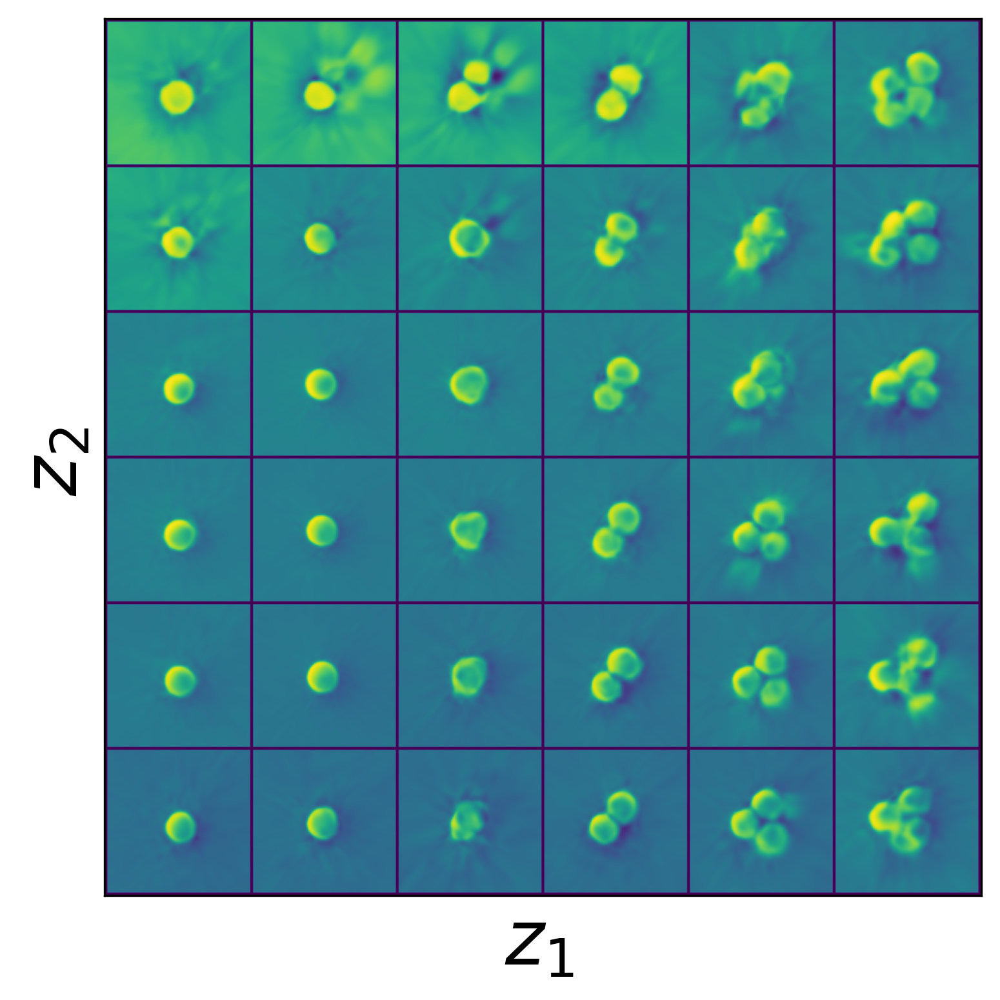

In [ ]:
grid = torchvision.utils.make_grid(manifold1_un_im1, nrow=d, padding=2, pad_value=0)[0]
plt.figure(figsize=(6,6), dpi=300)
plt.imshow(grid, cmap='viridis')
plt.xlabel("$z_1$ ", fontsize=28)
plt.ylabel("$z_2$ ", fontsize=28)
plt.xticks([])
plt.yticks([])

# plt.savefig('Latent_space_image.jpg')

Text(0.02, 0.5, 'Intensity (a.u.)')

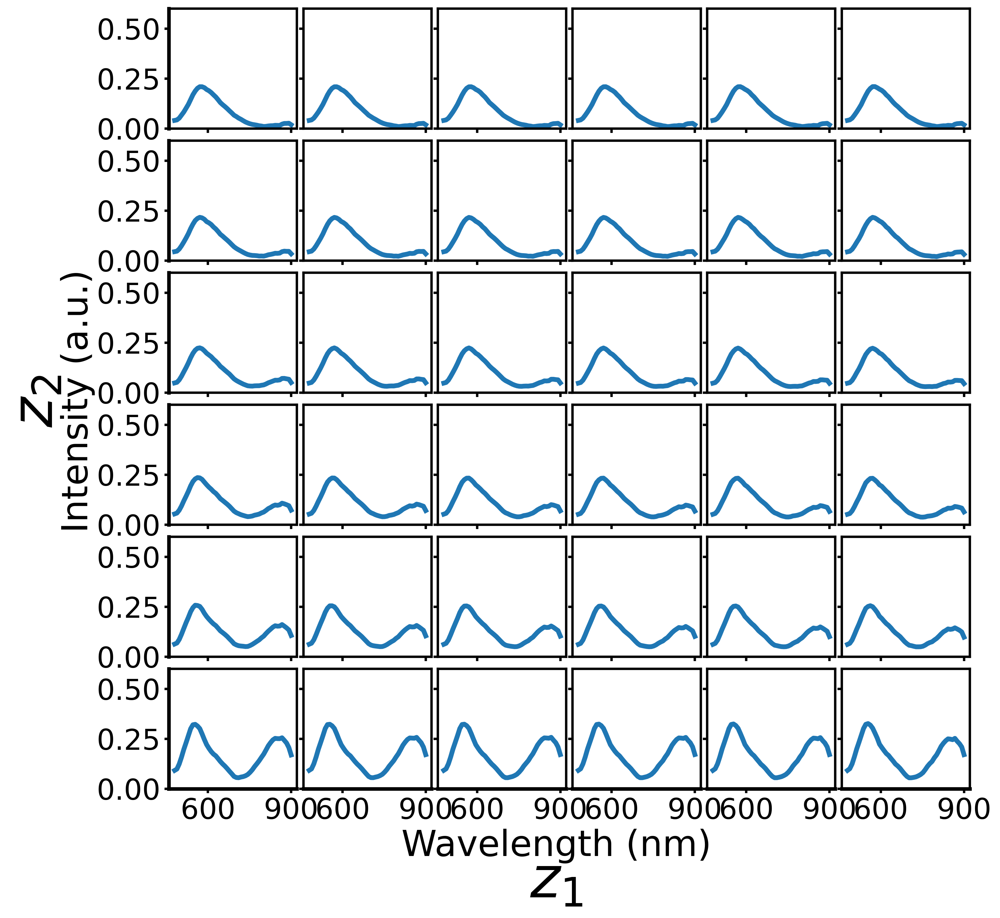

In [ ]:
wave=np.linspace(480,900,52)
fig, axes = plt.subplots(d, d, figsize=(12, 12), sharex= True, sharey= True,dpi=300,
                       subplot_kw={'xticks': [600,900],'yticks':[0,0.25,0.5] },
                       gridspec_kw=dict(hspace=0.1, wspace=0.05))
ik=0
for ax, y in zip(axes.flat, manifold2_un_spec1):
    ax.plot(wave, y.squeeze(), lw=4)
    ax.set_ylim(0, .6)
    ax.tick_params(axis = 'both', which = 'major', labelsize =24,width=2 )
    plt.setp(ax.spines.values(), linewidth=2)
    # ax.vlines(x=20,ymin=0, ymax=0.6, linewidth=1, color='k',linestyles='--')
    if ik % 6 == 0:
      ax.spines['left'].set_linewidth(3)
    if ik > 29:
      ax.spines['bottom'].set_linewidth(3)
    ik +=1

fig.text(0.5, 0.02, '$z_1$', ha='center', size=48)
fig.text(-0.03, 0.5, '$z_2$', va='center', rotation='vertical',size=48)
fig.text(0.5, 0.06, 'Wavelength (nm)', ha='center', size=30)
fig.text(0.02, 0.5, 'Intensity (a.u.)', va='center', rotation='vertical',size=30)
# fig.savefig('Latent_space_spectra.jpg')

In [ ]:
def hybrid_fwd_unshared(model: Type[torch.nn.Module], x: torch.Tensor,
               out: str) -> torch.Tensor:
    """
    Passes the input features through the encoder of the first (second) model to obtain
    a latent code which is then passed through the decoder of the second (first) model
    """
    if out not in ['image', 'spectrum']:
        raise NotImplementedError("argument 'out' must be 'image' or 'spectrum'")
    x = x.to(model.device)
    model.eval()
    with torch.no_grad():
        z_mu = model.encoder2(x)[0]  if out == 'image' else model.encoder1(x)[0]
        z_mu = z_mu[:, model.coord:] if out == 'spectrum' else z_mu
        dec1_input = (z_mu,)
        if model.coord > 0:
            grid = model.grid.expand(z_mu.size(0), *model.grid.size())
            dec1_input = (grid,) + dec1_input
        x_rec = model.decoder1(*dec1_input) if out == 'image' else model.decoder2(z_mu)
    return x_rec.cpu()


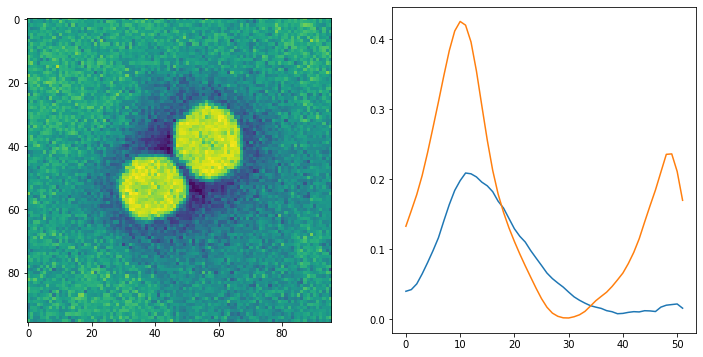

In [ ]:

k = 6

x_input = imgdata[k]
x_input = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred = hybrid_fwd(model_unshared, x_input, out='spectrum')

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(x_input.squeeze())
ax2.plot(x_pred.squeeze())
ax2.plot(specdata[k])

Let's also define a function that takes images (spectra) as an input at outputs spectra (images) and try it on the image -> spectrum predictions.

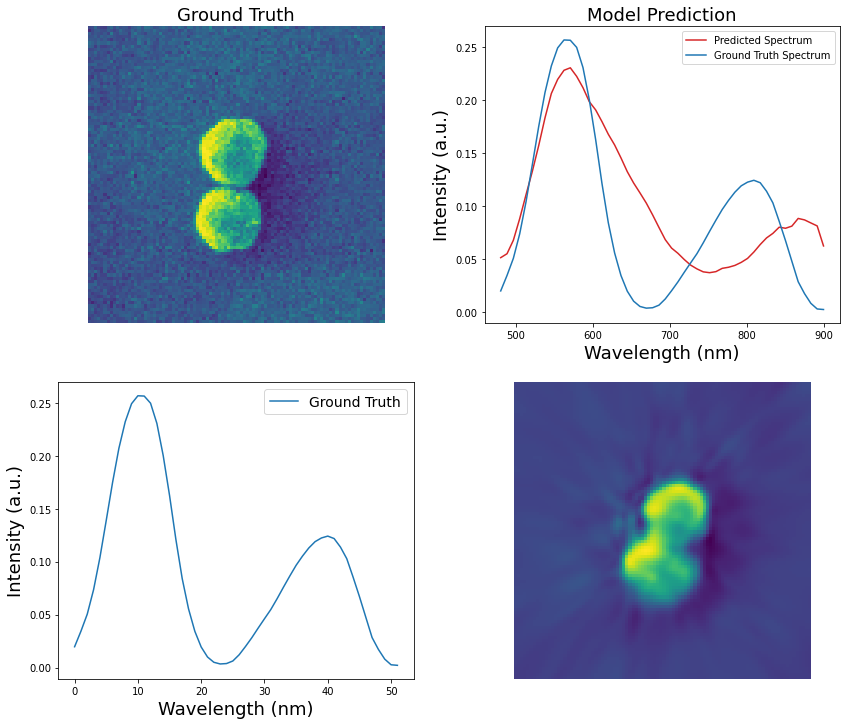

In [ ]:
k = 257 # input image/spectra index


wave=np.linspace(480,900,52)



fig, axes = plt.subplots(2,2 , figsize=(14,12), )

#Image as a input 
x_input = imgdata[k]
x_input_im = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_spec = hybrid_fwd_unshared(model_unshared, x_input_im, out='spectrum')

axes[0,0].imshow(x_input_im.squeeze())
axes[0,0].set_title('Ground Truth', size=18)
axes[0,0].axis('off')

axes[0,1].plot(wave,x_pred_spec.squeeze(), c='tab:red',label='Predicted Spectrum', )
axes[0,1].plot(wave,specdata[k],'tab:blue', label='Ground Truth Spectrum')
# a0.set_clim(0,0.00003)
axes[0,1].legend()
axes[0,1].set_xlabel('Wavelength (nm)', fontsize=18)
axes[0,1].set_ylabel('Intensity (a.u.)', fontsize=18)
axes[0,1].set_title('Model Prediction', size=18)

#spectra as a input 
x_input = specdata[k]
x_input_spec = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_im= hybrid_fwd_unshared(model_unshared, x_input_spec, out='image')

# axes[1,0].plot(x_pred.squeeze(), c='tab:red',label='Predict', )
axes[1,0].plot(specdata[k],c='tab:blue', label='Ground Truth')
# a0.set_clim(0,0.00003)

axes[0,1].legend()

axes[1,0].set_xlabel('Wavelength (nm)', fontsize=18)
axes[1,0].set_ylabel('Intensity (a.u.)', fontsize=18)
# axes[1,0].set_title('Ground Truth', size=18)
axes[1,0].legend(fontsize=14)

axes[1,1].imshow(x_pred_im.squeeze())
# axes[1,1].set_title("Model Prediction", size=18)
axes[1,1].axis('off')





plt.show()


